# Retina Disease Classification with EfficientNet-B3
## ระบบวิเคราะห์โรคจอประสาทตาด้วย Deep Learning พร้อม Cost-Sensitive Learning

### เนื้อหาในโปรแกรม:
1. **Data Preparation & Exploration** - การเตรียมและสำรวจข้อมูล
2. **Data Balancing** - การจัดการความไม่สมดุลของข้อมูล
3. **Data Augmentation** - การเพิ่มข้อมูลเฉพาะทางการแพทย์
4. **Model Architecture** - โมเดล EfficientNet-B3 ที่ปรับแต่งสำหรับ Retina
5. **Cost-Sensitive Learning** - การเรียนรู้แบบคำนึงถึงต้นทุนการวินิจฉัยผิด
6. **Training & Validation** - การเทรนและประเมินผล
7. **Model Evaluation** - การทดสอบและวิเคราะห์ผล

## 1. Import Libraries และติดตั้ง Dependencies

In [1]:
# Import Essential Libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import cv2
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

# PyTorch and Deep Learning
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms
import torch.nn.functional as F

# Sklearn for metrics and preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import (classification_report, confusion_matrix, 
                              roc_auc_score, roc_curve, auc, f1_score,
                              precision_recall_curve, average_precision_score)
from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import SMOTE, ADASYN

# Image processing and augmentation
from torchvision.transforms import functional as TF
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Utilities
from tqdm.auto import tqdm
from collections import Counter
import json
from datetime import datetime
import random

# Set random seeds for reproducibility
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

# Check device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

Using device: cuda
GPU: NVIDIA GeForce RTX 4050 Laptop GPU
Memory: 6.44 GB


## 2. Configuration และ Hyperparameters
### ตั้งค่าพารามิเตอร์อย่างละเอียดสำหรับการเทรน

In [2]:
class Config:
    """Configuration class สำหรับการตั้งค่าทั้งหมด"""
    
    # ===================== Data Paths =====================
    BASE_DIR = Path(r"c:\Users\Natsu\OneDrive\เดสก์ท็อป\Work\seminar1_Project")
    DATA_DIR = BASE_DIR / "retinal-disease-classification"
    TRAIN_DIR = DATA_DIR / "Training_Set" / "Training_Set" / "Training"
    TRAIN_LABELS = DATA_DIR / "Training_Set" / "Training_Set" / "RFMiD_Training_Labels.csv"
    VAL_DIR = DATA_DIR / "Evaluation_Set" / "Evaluation_Set" / "Validation"
    VAL_LABELS = DATA_DIR / "Evaluation_Set" / "Evaluation_Set" / "RFMiD_Validation_Labels.csv"
    TEST_DIR = DATA_DIR / "Test_Set" / "Test_Set" / "Test"
    TEST_LABELS = DATA_DIR / "Test_Set" / "Test_Set" / "RFMiD_Testing_Labels.csv"
    
    OUTPUT_DIR = BASE_DIR / "outputs"
    MODEL_DIR = OUTPUT_DIR / "models"
    RESULT_DIR = OUTPUT_DIR / "results"
    
    # สร้าง directories
    OUTPUT_DIR.mkdir(exist_ok=True)
    MODEL_DIR.mkdir(exist_ok=True)
    RESULT_DIR.mkdir(exist_ok=True)
    
    # ===================== Model Parameters =====================
    MODEL_NAME = "efficientnet_b3"
    IMG_SIZE = 300  # EfficientNet-B3 optimal size
    NUM_CLASSES = 28  # จำนวนโรคจอประสาทตา
    PRETRAINED = True
    
    # ===================== Training Parameters =====================
    BATCH_SIZE = 16  # ปรับตาม GPU memory
    NUM_EPOCHS = 100
    LEARNING_RATE = 1e-4
    WEIGHT_DECAY = 1e-5
    
    # Learning Rate Scheduler
    LR_SCHEDULER = "cosine"  # Options: "cosine", "step", "reduce_on_plateau"
    LR_WARMUP_EPOCHS = 5
    LR_MIN = 1e-7
    
    # Early Stopping
    EARLY_STOP_PATIENCE = 15
    
    # ===================== Optimization Parameters =====================
    OPTIMIZER = "adamw"  # Options: "adam", "adamw", "sgd"
    MOMENTUM = 0.9  # For SGD
    BETAS = (0.9, 0.999)  # For Adam/AdamW
    
    # Gradient Clipping
    GRAD_CLIP = 1.0
    
    # Mixed Precision Training
    USE_AMP = True  # Automatic Mixed Precision
    
    # ===================== Data Balancing =====================
    BALANCE_METHOD = "weighted_sampler"  # Options: "weighted_sampler", "smote", "class_weights"
    SAMPLING_STRATEGY = "auto"  # For SMOTE/ADASYN
    
    # ===================== Cost-Sensitive Learning =====================
    USE_COST_SENSITIVE = True
    # ต้นทุนการวินิจฉัยผิดสำหรับโรคร้ายแรง (เพิ่มน้ำหนักสำหรับโรคอันตราย)
    DISEASE_SEVERITY_WEIGHTS = {
        'DR': 3.0,  # Diabetic Retinopathy - ร้ายแรง
        'ARMD': 3.0,  # Age-related Macular Degeneration - ร้ายแรง
        'MH': 2.5,  # Macular Hole - ร้ายแรง
        'DN': 2.5,  # Diabetic Neuropathy - ร้ายแรง
        'MYA': 2.0,  # Myopia - ปานกลาง
        'BRVO': 2.5,  # Branch Retinal Vein Occlusion - ร้ายแรง
        'TSLN': 2.5,  # Tessellation - ร้ายแรง
        'ERM': 2.0,  # Epiretinal Membrane - ปานกลาง
        'LS': 2.0,  # Laser Scar - ปานกลาง
        'MS': 2.0,  # Macroaneurysm - ปานกลาง
        'CSR': 2.5,  # Central Serous Retinopathy - ร้ายแรง
        'ODC': 2.0,  # Optic Disc Cupping - ปานกลาง
        'CRVO': 3.0,  # Central Retinal Vein Occlusion - ร้ายแรงมาก
        'TV': 2.0,  # Tortuous Vessels - ปานกลาง
        'AH': 2.5,  # Asteroid Hyalosis - ร้ายแรง
        'ODP': 2.5,  # Optic Disc Pallor - ร้ายแรง
        'ODE': 3.0,  # Optic Disc Edema - ร้ายแรงมาก
        'ST': 2.0,  # Optociliary Shunt - ปานกลาง
        'AION': 3.0,  # Anterior Ischemic Optic Neuropathy - ร้ายแรงมาก
        'PT': 2.0,  # Parafoveal Telangiectasia - ปานกลาง
        'RT': 2.5,  # Retinal Traction - ร้ายแรง
        'RS': 2.5,  # Retinitis - ร้ายแรง
        'CRS': 2.5,  # Chorioretinitis - ร้ายแรง
        'EDN': 2.5,  # Exudation - ร้ายแรง
        'RPEC': 2.5,  # RPE Changes - ร้ายแรง
        'MHL': 2.5,  # Macular Hole - ร้ายแรง
        'RP': 3.0,  # Retinitis Pigmentosa - ร้ายแรงมาก
        'OTHER': 1.5  # Other - น้อย
    }
    
    # ===================== Augmentation Parameters =====================
    # Medical-specific augmentation for retina images
    AUGMENT_PROB = 0.5
    ROTATION_LIMIT = 20  # องศา
    BRIGHTNESS_LIMIT = 0.2
    CONTRAST_LIMIT = 0.2
    HUE_SHIFT_LIMIT = 10
    SAT_SHIFT_LIMIT = 20
    
    # Advanced augmentation
    USE_CLAHE = True  # Contrast Limited Adaptive Histogram Equalization
    USE_BLUR = True
    USE_OPTICAL_DISTORTION = True
    USE_GRID_DISTORTION = True
    
    # ===================== Model Architecture =====================
    DROPOUT_RATE = 0.3
    USE_ATTENTION = True  # Attention mechanism
    FREEZE_BACKBONE_EPOCHS = 5  # Freeze backbone layers for first N epochs
    
    # Custom layers
    HIDDEN_DIMS = [1024, 512]  # Hidden dimensions for custom classifier
    USE_BATCH_NORM = True
    
    # ===================== Loss Function =====================
    LOSS_FUNCTION = "focal_loss"  # Options: "bce", "focal_loss", "asymmetric_loss"
    FOCAL_ALPHA = 0.25
    FOCAL_GAMMA = 2.0
    
    # ===================== Validation & Testing =====================
    VAL_SPLIT = 0.15  # If using train_test_split
    TEST_TIME_AUGMENTATION = True  # TTA for better inference
    TTA_TRANSFORMS = 5  # Number of augmentations for TTA
    
    # Metrics thresholds
    CLASSIFICATION_THRESHOLD = 0.5
    
    # ===================== Logging & Checkpointing =====================
    LOG_INTERVAL = 10  # Log every N batches
    SAVE_BEST_ONLY = True
    SAVE_LAST = True
    
    # WandB or TensorBoard (optional)
    USE_WANDB = False
    WANDB_PROJECT = "retina-disease-classification"
    
    # ===================== Inference =====================
    ENSEMBLE_MODELS = False  # Use multiple models for ensemble
    NUM_ENSEMBLE = 3

# Create config instance
config = Config()

# Print configuration
print("=" * 50)
print("CONFIGURATION SUMMARY")
print("=" * 50)
print(f"Model: {config.MODEL_NAME}")
print(f"Image Size: {config.IMG_SIZE}x{config.IMG_SIZE}")
print(f"Batch Size: {config.BATCH_SIZE}")
print(f"Learning Rate: {config.LEARNING_RATE}")
print(f"Number of Epochs: {config.NUM_EPOCHS}")
print(f"Cost-Sensitive Learning: {config.USE_COST_SENSITIVE}")
print(f"Balance Method: {config.BALANCE_METHOD}")
print(f"Loss Function: {config.LOSS_FUNCTION}")
print(f"Device: {device}")
print("=" * 50)

CONFIGURATION SUMMARY
Model: efficientnet_b3
Image Size: 300x300
Batch Size: 16
Learning Rate: 0.0001
Number of Epochs: 100
Cost-Sensitive Learning: True
Balance Method: weighted_sampler
Loss Function: focal_loss
Device: cuda


## 3. Data Loading และ Exploration
### โหลดและสำรวจข้อมูลภาพจอประสาทตา

In [3]:
# Load training labels
train_df = pd.read_csv(config.TRAIN_LABELS)
print(f"Training data shape: {train_df.shape}")
print(f"\nFirst few rows:")
print(train_df.head())

# Get disease columns (exclude ID column)
disease_columns = [col for col in train_df.columns if col != 'ID']
config.NUM_CLASSES = len(disease_columns)
print(f"\nNumber of disease classes: {config.NUM_CLASSES}")
print(f"Disease columns: {disease_columns}")

Training data shape: (1920, 47)

First few rows:
   ID  Disease_Risk  DR  ARMD  MH  DN  MYA  BRVO  TSLN  ERM  ...  CME  PTCR  \
0   1             1   1     0   0   0    0     0     0    0  ...    0     0   
1   2             1   1     0   0   0    0     0     0    0  ...    0     0   
2   3             1   1     0   0   0    0     0     0    0  ...    0     0   
3   4             1   0     0   1   0    0     0     0    0  ...    0     0   
4   5             1   1     0   0   0    0     0     0    0  ...    0     0   

   CF  VH  MCA  VS  BRAO  PLQ  HPED  CL  
0   0   0    0   0     0    0     0   0  
1   0   0    0   0     0    0     0   0  
2   0   0    0   0     0    0     0   0  
3   0   0    0   0     0    0     0   0  
4   0   0    0   0     0    0     0   0  

[5 rows x 47 columns]

Number of disease classes: 46
Disease columns: ['Disease_Risk', 'DR', 'ARMD', 'MH', 'DN', 'MYA', 'BRVO', 'TSLN', 'ERM', 'LS', 'MS', 'CSR', 'ODC', 'CRVO', 'TV', 'AH', 'ODP', 'ODE', 'ST', 'AION', 'PT', 


CHECKING FOR EMPTY CLASSES
⚠️  Found 2 classes with 0 samples:
   - ODPM
   - HR

🗑️  Removing 2 empty classes...
✅ Remaining classes: 44

CLASS DISTRIBUTION (After Filtering)
Disease_Risk   :  1519 samples (79.11%)
DR             :   376 samples (19.58%)
MH             :   317 samples (16.51%)
ODC            :   282 samples (14.69%)
TSLN           :   186 samples ( 9.69%)
DN             :   138 samples ( 7.19%)
MYA            :   101 samples ( 5.26%)
ARMD           :   100 samples ( 5.21%)
BRVO           :    73 samples ( 3.80%)
ODP            :    65 samples ( 3.39%)
ODE            :    58 samples ( 3.02%)
LS             :    47 samples ( 2.45%)
RS             :    43 samples ( 2.24%)
CSR            :    37 samples ( 1.93%)
CRS            :    32 samples ( 1.67%)
CRVO           :    28 samples ( 1.46%)
RPEC           :    22 samples ( 1.15%)
AION           :    17 samples ( 0.89%)
AH             :    16 samples ( 0.83%)
MS             :    15 samples ( 0.78%)
EDN            :    15 

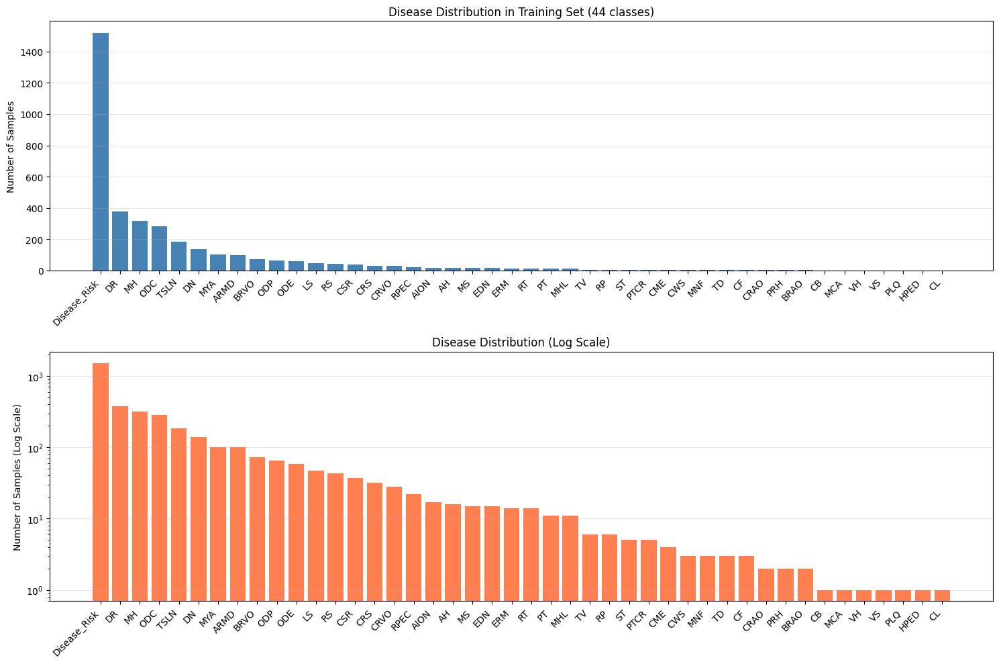


⚠️  Class Imbalance Ratio: 1519.00:1
Most common: Disease_Risk (1519 samples)
Least common: CL (1 samples)

📊 Final Statistics:
   Total Classes: 44
   Total Samples: 1920
   Min samples per class: 1
   Max samples per class: 1519
   Mean samples per class: 81.5
   Median samples per class: 14.0


In [4]:
# Analyze class distribution
class_counts = train_df[disease_columns].sum().sort_values(ascending=False)

# Filter out classes with 0 samples
print("\n" + "="*50)
print("CHECKING FOR EMPTY CLASSES")
print("="*50)
empty_classes = class_counts[class_counts == 0].index.tolist()
if len(empty_classes) > 0:
    print(f"⚠️  Found {len(empty_classes)} classes with 0 samples:")
    for disease in empty_classes:
        print(f"   - {disease}")
    print(f"\n🗑️  Removing {len(empty_classes)} empty classes...")
    
    # Remove empty classes from disease_columns and dataframe
    disease_columns = [col for col in disease_columns if col not in empty_classes]
    train_df = train_df.drop(columns=empty_classes)
    
    # Update class_counts
    class_counts = train_df[disease_columns].sum().sort_values(ascending=False)
    
    # Update config
    config.NUM_CLASSES = len(disease_columns)
    print(f"✅ Remaining classes: {config.NUM_CLASSES}")
else:
    print("✅ All classes have data!")

print("\n" + "="*50)
print("CLASS DISTRIBUTION (After Filtering)")
print("="*50)
for disease, count in class_counts.items():
    percentage = (count / len(train_df)) * 100
    print(f"{disease:15s}: {count:5d} samples ({percentage:5.2f}%)")

# Visualize class distribution
fig, axes = plt.subplots(2, 1, figsize=(15, 10))

# Bar plot
axes[0].bar(range(len(class_counts)), class_counts.values, color='steelblue')
axes[0].set_xticks(range(len(class_counts)))
axes[0].set_xticklabels(class_counts.index, rotation=45, ha='right')
axes[0].set_ylabel('Number of Samples')
axes[0].set_title(f'Disease Distribution in Training Set ({len(disease_columns)} classes)')
axes[0].grid(axis='y', alpha=0.3)

# Log scale for better visualization
axes[1].bar(range(len(class_counts)), class_counts.values, color='coral')
axes[1].set_xticks(range(len(class_counts)))
axes[1].set_xticklabels(class_counts.index, rotation=45, ha='right')
axes[1].set_ylabel('Number of Samples (Log Scale)')
axes[1].set_yscale('log')
axes[1].set_title('Disease Distribution (Log Scale)')
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(config.RESULT_DIR / 'class_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# Check for imbalance
if len(class_counts) > 0 and class_counts.min() > 0:
    imbalance_ratio = class_counts.max() / class_counts.min()
    print(f"\n⚠️  Class Imbalance Ratio: {imbalance_ratio:.2f}:1")
    print(f"Most common: {class_counts.index[0]} ({class_counts.values[0]} samples)")
    print(f"Least common: {class_counts.index[-1]} ({class_counts.values[-1]} samples)")
    print(f"\n📊 Final Statistics:")
    print(f"   Total Classes: {len(disease_columns)}")
    print(f"   Total Samples: {len(train_df)}")
    print(f"   Min samples per class: {class_counts.min():.0f}")
    print(f"   Max samples per class: {class_counts.max():.0f}")
    print(f"   Mean samples per class: {class_counts.mean():.1f}")
    print(f"   Median samples per class: {class_counts.median():.1f}")

🔍 Checking data paths...
✅ Training directory found: c:\Users\Natsu\OneDrive\เดสก์ท็อป\Work\seminar1_Project\retinal-disease-classification\Training_Set\Training_Set\Training

📁 Found 1920 files in directory
Testing first few files:
   ✅ OK - 1.png
   ✅ OK - 10.png
   ✅ OK - 100.png
   ✅ OK - 1000.png
   ✅ OK - 1001.png

Loading sample images for visualization...

✅ Figure saved to: c:\Users\Natsu\OneDrive\เดสก์ท็อป\Work\seminar1_Project\outputs\results\sample_images.png

✅ Figure saved to: c:\Users\Natsu\OneDrive\เดสก์ท็อป\Work\seminar1_Project\outputs\results\sample_images.png


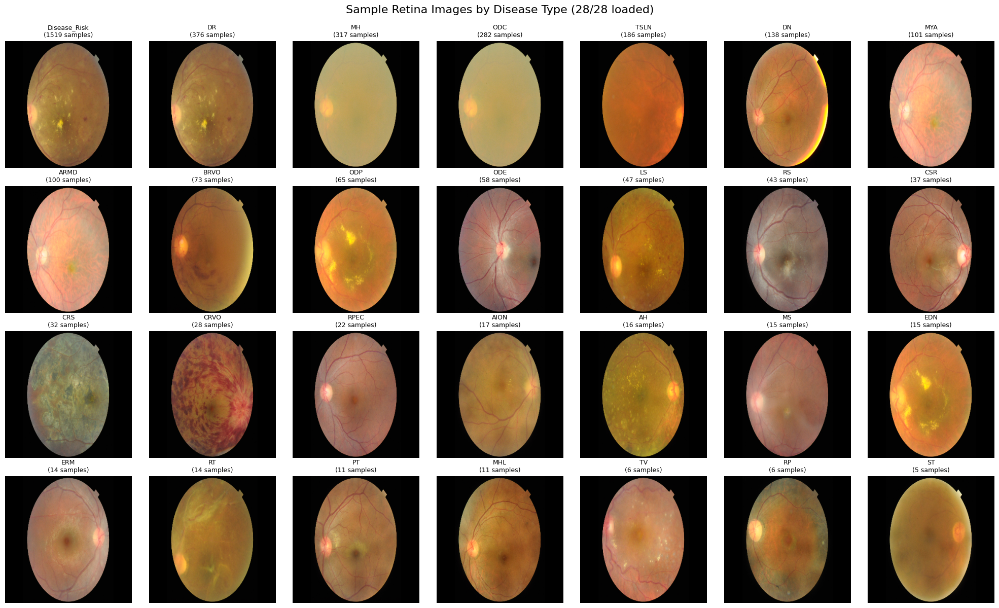


📊 SUMMARY
✅ Successfully loaded: 28/28 images


In [5]:
# Preview sample images - Fixed for Unicode path
def load_and_preprocess_image(img_path, target_size=(300, 300)):
    """Load and preprocess retina image - handles Unicode paths"""
    try:
        # Method 1: Use PIL (better with Unicode)
        from PIL import Image
        img_pil = Image.open(str(img_path))
        img = np.array(img_pil)
        
        # Convert to RGB if needed
        if len(img.shape) == 2:  # Grayscale
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        elif img.shape[2] == 4:  # RGBA
            img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)
        
        # Resize
        img = cv2.resize(img, target_size)
        return img
        
    except Exception as e:
        # Method 2: Use numpy and cv2 for Unicode path
        try:
            img_array = np.fromfile(str(img_path), dtype=np.uint8)
            img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)
            if img is not None:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, target_size)
                return img
        except:
            pass
    
    print(f"⚠️  Warning: Could not load image: {img_path.name}")
    return None

# Check if training directory exists
print("🔍 Checking data paths...")
if not config.TRAIN_DIR.exists():
    print(f"❌ Error: Training directory not found: {config.TRAIN_DIR}")
else:
    print(f"✅ Training directory found: {config.TRAIN_DIR}")
    
    # List and test loading some files
    image_files = list(config.TRAIN_DIR.glob('*.png'))[:5]
    if not image_files:
        image_files = list(config.TRAIN_DIR.glob('*.jpg'))[:5]
    
    if image_files:
        print(f"\n📁 Found {len(list(config.TRAIN_DIR.glob('*')))} files in directory")
        print(f"Testing first few files:")
        for f in image_files:
            test_img = load_and_preprocess_image(f)
            status = "✅ OK" if test_img is not None else "❌ Failed"
            print(f"   {status} - {f.name}")
    else:
        print("⚠️  No image files found!")

print("\n" + "="*70)
print("Loading sample images for visualization...")
print("="*70)

# Visualize sample images from each disease
fig, axes = plt.subplots(4, 7, figsize=(20, 12))
axes = axes.flatten()

sample_diseases = class_counts.head(28).index  # Top diseases
images_displayed = 0
failed_diseases = []

for idx, disease in enumerate(sample_diseases):
    if idx >= 28:
        break
    
    try:
        # Find a sample with this disease
        disease_samples = train_df[train_df[disease] == 1]
        if len(disease_samples) == 0:
            axes[idx].text(0.5, 0.5, f'{disease}\nNo samples', 
                          ha='center', va='center', fontsize=8)
            axes[idx].axis('off')
            continue
        
        # Try multiple samples if first one fails
        loaded = False
        for sample_idx in range(min(3, len(disease_samples))):
            sample_row = disease_samples.iloc[sample_idx]
            img_path = config.TRAIN_DIR / f"{sample_row['ID']}.png"
            
            img = load_and_preprocess_image(img_path)
            if img is not None:
                axes[idx].imshow(img)
                axes[idx].set_title(f"{disease}\n({class_counts[disease]} samples)", fontsize=9)
                axes[idx].axis('off')
                images_displayed += 1
                loaded = True
                break
        
        if not loaded:
            # Show placeholder
            axes[idx].text(0.5, 0.5, f'{disease}\nImage load failed', 
                          ha='center', va='center', fontsize=8, color='red')
            axes[idx].axis('off')
            failed_diseases.append(disease)
            
    except Exception as e:
        print(f"❌ Error processing {disease}: {str(e)}")
        axes[idx].text(0.5, 0.5, f'{disease}\nError', 
                      ha='center', va='center', fontsize=8, color='red')
        axes[idx].axis('off')

# Hide unused axes
for idx in range(len(sample_diseases), len(axes)):
    axes[idx].axis('off')

plt.suptitle(f'Sample Retina Images by Disease Type ({images_displayed}/{len(sample_diseases)} loaded)', 
             fontsize=16, y=0.995)
plt.tight_layout()

# Save figure
try:
    save_path = config.RESULT_DIR / 'sample_images.png'
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"\n✅ Figure saved to: {save_path}")
except Exception as e:
    print(f"⚠️  Could not save figure: {e}")

plt.show()

print("\n" + "="*70)
print(f"📊 SUMMARY")
print("="*70)
print(f"✅ Successfully loaded: {images_displayed}/{len(sample_diseases)} images")
if failed_diseases:
    print(f"❌ Failed to load: {len(failed_diseases)} diseases")
    print(f"   Failed: {', '.join(failed_diseases[:5])}")
    if len(failed_diseases) > 5:
        print(f"   ... and {len(failed_diseases)-5} more")
print("="*70)

## 4. Medical-Specific Image Preprocessing
### การประมวลผลภาพเฉพาะทางการแพทย์สำหรับจอประสาทตา

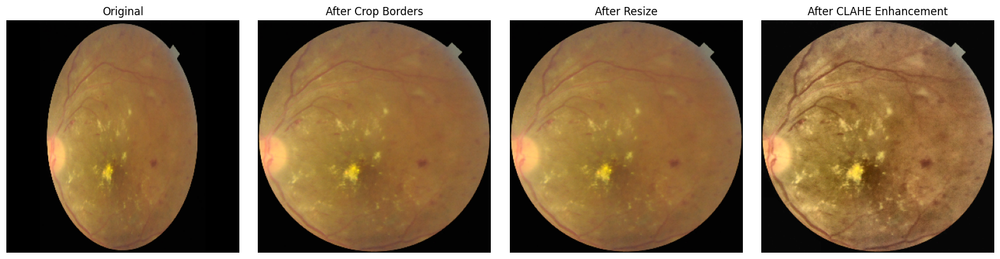

✅ Preprocessing pipeline ready! Visualized image: 1.png


In [6]:
class RetinaImagePreprocessor:
    """
    การประมวลผลภาพจอประสาทตาตามหลักทางการแพทย์
    - CLAHE: เพิ่ม contrast สำหรับเส้นเลือดและรอยโรค
    - Green Channel: ช่องสีเขียวให้รายละเอียดดีที่สุด
    - Circular Mask: ตัดเฉพาะส่วนจอประสาทตา
    - Normalization: ปรับค่าสีให้เหมาะสมกับ ImageNet
    """
    
    def __init__(self, img_size=300):
        self.img_size = img_size
        self.clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        
    def apply_clahe(self, image):
        """Apply CLAHE to enhance contrast"""
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        l = self.clahe.apply(l)
        enhanced = cv2.merge([l, a, b])
        return cv2.cvtColor(enhanced, cv2.COLOR_LAB2RGB)
    
    def crop_black_borders(self, image, threshold=7):
        """Remove black borders from retina images"""
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        _, thresh = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)
        
        # Find contours
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not contours:
            return image
        
        # Get bounding box of largest contour
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)
        
        # Crop with some padding
        padding = 5
        x = max(0, x - padding)
        y = max(0, y - padding)
        w = min(image.shape[1] - x, w + 2 * padding)
        h = min(image.shape[0] - y, h + 2 * padding)
        
        return image[y:y+h, x:x+w]
    
    def create_circular_mask(self, image):
        """Create circular mask for retina region"""
        h, w = image.shape[:2]
        center = (w // 2, h // 2)
        radius = min(center[0], center[1]) - 10
        
        mask = np.zeros((h, w), dtype=np.uint8)
        cv2.circle(mask, center, radius, 255, -1)
        
        # Apply mask
        masked = cv2.bitwise_and(image, image, mask=mask)
        return masked
    
    def preprocess(self, image_path):
        """Full preprocessing pipeline"""
        # Load image using numpy to handle Unicode paths
        img = cv2.imdecode(np.fromfile(str(image_path), dtype=np.uint8), cv2.IMREAD_COLOR)
        if img is None:
            return None
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Remove black borders
        img = self.crop_black_borders(img)
        
        # Resize
        img = cv2.resize(img, (self.img_size, self.img_size))
        
        # Apply CLAHE for better contrast
        img = self.apply_clahe(img)
        
        return img
    
    def visualize_preprocessing(self, image_path):
        """Visualize preprocessing steps"""
        # Load original using numpy to handle Unicode paths
        original = cv2.imdecode(np.fromfile(str(image_path), dtype=np.uint8), cv2.IMREAD_COLOR)
        if original is None:
            raise ValueError(f"Failed to load image: {image_path}")
        original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
        
        # Step 1: Crop borders
        cropped = self.crop_black_borders(original.copy())
        
        # Step 2: Resize
        resized = cv2.resize(cropped, (self.img_size, self.img_size))
        
        # Step 3: CLAHE
        enhanced = self.apply_clahe(resized.copy())
        
        # Visualize
        fig, axes = plt.subplots(1, 4, figsize=(16, 4))
        
        axes[0].imshow(cv2.resize(original, (self.img_size, self.img_size)))
        axes[0].set_title('Original')
        axes[0].axis('off')
        
        axes[1].imshow(cv2.resize(cropped, (self.img_size, self.img_size)))
        axes[1].set_title('After Crop Borders')
        axes[1].axis('off')
        
        axes[2].imshow(resized)
        axes[2].set_title('After Resize')
        axes[2].axis('off')
        
        axes[3].imshow(enhanced)
        axes[3].set_title('After CLAHE Enhancement')
        axes[3].axis('off')
        
        plt.tight_layout()
        return fig

# Initialize preprocessor
preprocessor = RetinaImagePreprocessor(img_size=config.IMG_SIZE)

# Visualize preprocessing on a sample image
# Find a valid image file that exists
sample_img_path = None
for idx in range(len(train_df)):
    potential_path = config.TRAIN_DIR / f"{train_df.iloc[idx]['ID']}.png"
    if potential_path.exists():
        sample_img_path = potential_path
        break

if sample_img_path is not None:
    fig = preprocessor.visualize_preprocessing(sample_img_path)
    plt.savefig(config.RESULT_DIR / 'preprocessing_steps.png', dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✅ Preprocessing pipeline ready! Visualized image: {sample_img_path.name}")
else:
    print("⚠️ No valid image found in training directory. Skipping visualization.")
    print(f"Checked directory: {config.TRAIN_DIR}")

## 5. Advanced Data Augmentation
### การเพิ่มข้อมูลเฉพาะทางสำหรับภาพจอประสาทตา

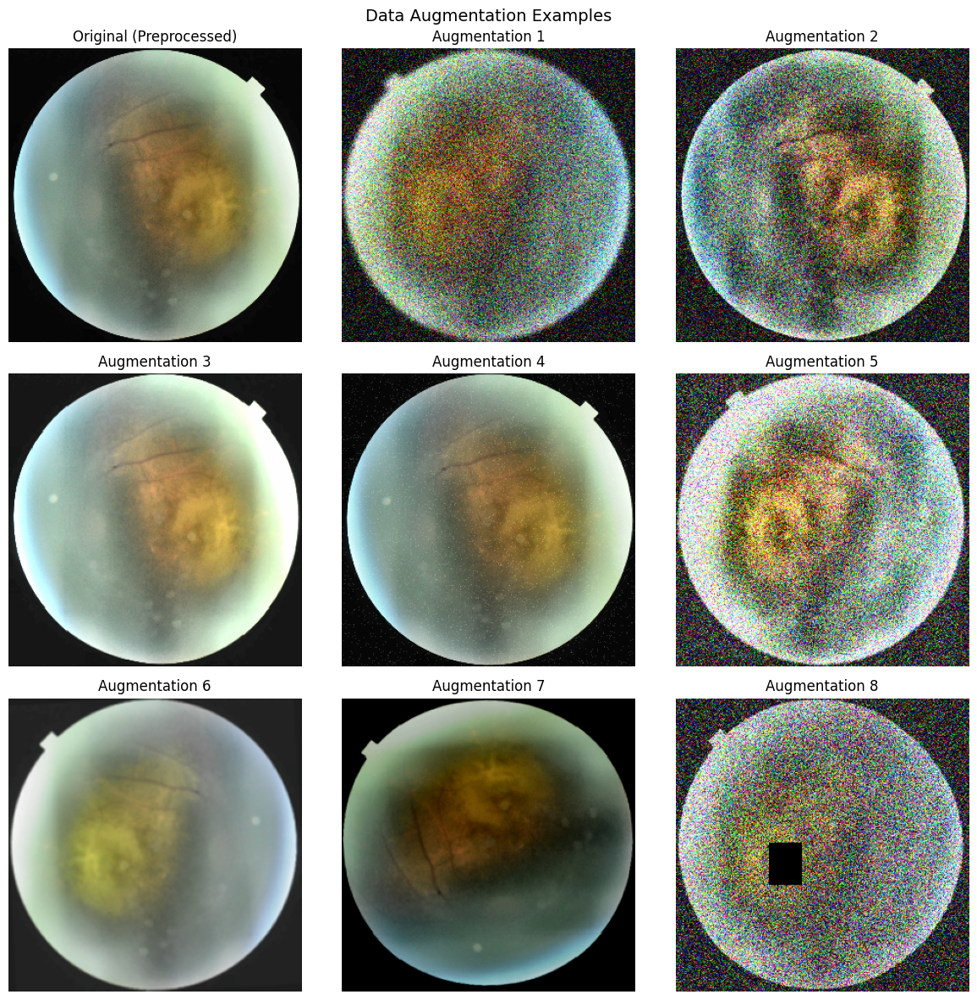

✅ Augmentation pipeline ready!


In [7]:
def get_train_transforms(img_size=300):
    """
    Medical-specific augmentation for retina images
    - การหมุน: เพราะจอประสาทตาถ่ายจากมุมต่างๆ
    - การสะท้อน: Flip ได้ทั้งตาซ้ายและขวา
    - สี: ปรับความสว่างและคอนทราสต์ตามสภาพแสง
    - CLAHE: เพิ่ม contrast ของเส้นเลือด
    - Blur: จำลองภาพที่ไม่ชัด
    - Noise: จำลอง noise จากกล้อง
    """
    return A.Compose([
        # Spatial transformations
        A.Rotate(limit=config.ROTATION_LIMIT, p=0.7, border_mode=cv2.BORDER_CONSTANT, value=0),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        
        # Optical distortions (เลนส์กล้องและรูปร่างลูกตา)
        A.OpticalDistortion(distort_limit=0.1, shift_limit=0.1, p=0.3) if config.USE_OPTICAL_DISTORTION else A.NoOp(),
        A.GridDistortion(num_steps=5, distort_limit=0.1, p=0.3) if config.USE_GRID_DISTORTION else A.NoOp(),
        
        # Color augmentations (สภาพแสงและการตั้งค่ากล้อง)
        A.RandomBrightnessContrast(
            brightness_limit=config.BRIGHTNESS_LIMIT,
            contrast_limit=config.CONTRAST_LIMIT,
            p=0.7
        ),
        A.HueSaturationValue(
            hue_shift_limit=config.HUE_SHIFT_LIMIT,
            sat_shift_limit=config.SAT_SHIFT_LIMIT,
            val_shift_limit=20,
            p=0.5
        ),
        A.RandomGamma(gamma_limit=(80, 120), p=0.3),
        
        # CLAHE for better vessel visibility
        A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=0.5) if config.USE_CLAHE else A.NoOp(),
        
        # Quality degradation (จำลองภาพคุณภาพต่ำ)
        A.OneOf([
            A.Blur(blur_limit=3, p=1.0),
            A.MedianBlur(blur_limit=3, p=1.0),
            A.GaussianBlur(blur_limit=3, p=1.0),
        ], p=0.2) if config.USE_BLUR else A.NoOp(),
        
        A.GaussNoise(var_limit=(10.0, 50.0), p=0.2),
        A.ISONoise(p=0.2),
        
        # Cutout/CoarseDropout (จำลองการบดบัง)
        A.CoarseDropout(
            max_holes=8,
            max_height=img_size // 10,
            max_width=img_size // 10,
            min_holes=1,
            fill_value=0,
            p=0.2
        ),
        
        # Normalize to ImageNet statistics
        A.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225],
            max_pixel_value=255.0,
        ),
        
        ToTensorV2()
    ])

def get_val_transforms(img_size=300):
    """Validation transforms - no augmentation"""
    return A.Compose([
        A.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225],
            max_pixel_value=255.0,
        ),
        ToTensorV2()
    ])

# Visualize augmentation
def visualize_augmentations(image_path, num_augmentations=8):
    """Visualize different augmentations"""
    img = preprocessor.preprocess(image_path)
    transform = get_train_transforms(config.IMG_SIZE)
    
    fig, axes = plt.subplots(3, 3, figsize=(12, 12))
    axes = axes.flatten()
    
    # Original
    axes[0].imshow(img)
    axes[0].set_title('Original (Preprocessed)')
    axes[0].axis('off')
    
    # Augmented versions
    for i in range(1, 9):
        augmented = transform(image=img)['image']
        
        # Denormalize for visualization
        img_viz = augmented.permute(1, 2, 0).numpy()
        img_viz = img_viz * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img_viz = np.clip(img_viz, 0, 1)
        
        axes[i].imshow(img_viz)
        axes[i].set_title(f'Augmentation {i}')
        axes[i].axis('off')
    
    plt.suptitle('Data Augmentation Examples', fontsize=14)
    plt.tight_layout()
    return fig

# Test augmentation
sample_img_path = config.TRAIN_DIR / f"{train_df.iloc[10]['ID']}.png"
fig = visualize_augmentations(sample_img_path)
plt.savefig(config.RESULT_DIR / 'augmentation_examples.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Augmentation pipeline ready!")

## 6. Custom Dataset และ Data Balancing
### สร้าง Dataset และจัดการความไม่สมดุลของข้อมูล

In [8]:
class RetinaDataset(Dataset):
    """Custom Dataset for Retina Disease Classification"""
    
    def __init__(self, dataframe, img_dir, disease_columns, transform=None, preprocessor=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.img_dir = Path(img_dir)
        self.disease_columns = disease_columns
        self.transform = transform
        self.preprocessor = preprocessor
        
    def __len__(self):
        return len(self.dataframe)
    
    def __getitem__(self, idx):
        # Get image path
        img_id = self.dataframe.iloc[idx]['ID']
        img_path = self.img_dir / f"{img_id}.png"
        
        # Load and preprocess image
        if self.preprocessor:
            image = self.preprocessor.preprocess(img_path)
        else:
            image = cv2.imread(str(img_path))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (config.IMG_SIZE, config.IMG_SIZE))
        
        # Apply augmentation
        if self.transform:
            transformed = self.transform(image=image)
            image = transformed['image']
        
        # Get multi-label target
        labels = self.dataframe.iloc[idx][self.disease_columns].values.astype(np.float32)
        
        return image, torch.tensor(labels, dtype=torch.float32), img_id

# Prepare data splits
print("Preparing data splits...")
train_val_df, test_df = train_test_split(
    train_df, 
    test_size=config.VAL_SPLIT, 
    random_state=42,
    stratify=train_df[disease_columns].sum(axis=1).apply(lambda x: min(x, 3))  # Stratify by disease count
)

train_val_df = train_val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

print(f"Train+Val set: {len(train_val_df)} samples")
print(f"Test set: {len(test_df)} samples")

# Save disease columns for later use
disease_columns = [col for col in train_df.columns if col != 'ID']

print(f"\nDisease classes: {len(disease_columns)}")
print(disease_columns)

Preparing data splits...
Train+Val set: 1632 samples
Test set: 288 samples

Disease classes: 44
['Disease_Risk', 'DR', 'ARMD', 'MH', 'DN', 'MYA', 'BRVO', 'TSLN', 'ERM', 'LS', 'MS', 'CSR', 'ODC', 'CRVO', 'TV', 'AH', 'ODP', 'ODE', 'ST', 'AION', 'PT', 'RT', 'RS', 'CRS', 'EDN', 'RPEC', 'MHL', 'RP', 'CWS', 'CB', 'PRH', 'MNF', 'CRAO', 'TD', 'CME', 'PTCR', 'CF', 'VH', 'MCA', 'VS', 'BRAO', 'PLQ', 'HPED', 'CL']


Class Weights (for loss function):
Disease_Risk   : 0.0005
DR             : 0.0085
ARMD           : 0.0388
MH             : 0.0104
DN             : 0.0271
MYA            : 0.0383
BRVO           : 0.0526
TSLN           : 0.0188
ERM            : 0.2804
LS             : 0.0827
MS             : 0.2401
CSR            : 0.1109
ODC            : 0.0118
CRVO           : 0.1283
TV             : 0.6760
AH             : 0.3061
ODP            : 0.0596
ODE            : 0.0657
ST             : 0.8455
AION           : 0.2239
PT             : 0.3746
RT             : 0.2804
RS             : 0.0921
CRS            : 0.1148
EDN            : 0.2804
RPEC           : 0.1973
MHL            : 0.4822
RP             : 0.5630
CWS            : 1.6930
CB             : 3.3881
PRH            : 3.3881
MNF            : 1.6930
CRAO           : 1.6930
TD             : 1.6930
CME            : 0.8455
PTCR           : 0.8455
CF             : 1.1280
VH             : 3.3881
MCA            : 3.3881
VS             : 3.3881
BRAO 

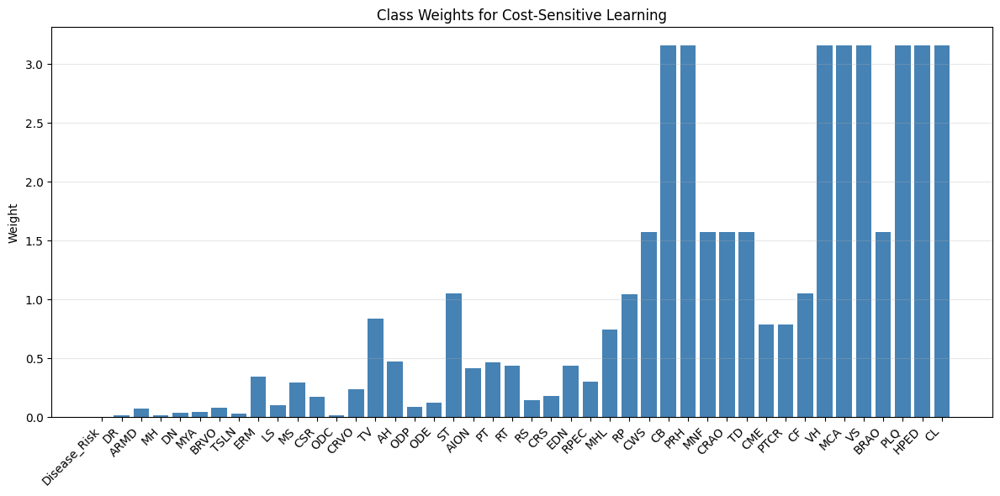

In [9]:
# Calculate class weights for balancing
def calculate_class_weights(df, disease_columns):
    """Calculate class weights for imbalanced data"""
    pos_counts = df[disease_columns].sum()
    neg_counts = len(df) - pos_counts
    
    # Inverse frequency weighting
    weights = neg_counts / (pos_counts + 1e-6)
    
    # Normalize
    weights = weights / weights.sum() * len(disease_columns)
    
    return torch.tensor(weights.values, dtype=torch.float32)

# Calculate weights
class_weights = calculate_class_weights(train_val_df, disease_columns)
print("Class Weights (for loss function):")
for disease, weight in zip(disease_columns, class_weights):
    print(f"{disease:15s}: {weight:.4f}")

# Apply cost-sensitive weights if enabled
if config.USE_COST_SENSITIVE:
    print("\n" + "="*50)
    print("Applying Cost-Sensitive Learning Weights")
    print("="*50)
    
    # Map disease names to severity weights
    severity_weights = torch.ones(len(disease_columns))
    for idx, disease in enumerate(disease_columns):
        if disease in config.DISEASE_SEVERITY_WEIGHTS:
            severity_weights[idx] = config.DISEASE_SEVERITY_WEIGHTS[disease]
        else:
            severity_weights[idx] = 1.5  # Default for unknown diseases
    
    # Combine class imbalance weights with severity weights
    final_weights = class_weights * severity_weights
    final_weights = final_weights / final_weights.mean()  # Normalize
    
    print("\nFinal Weights (Class Imbalance × Disease Severity):")
    for disease, weight in zip(disease_columns, final_weights):
        print(f"{disease:15s}: {weight:.4f}")
    
    class_weights = final_weights

# Save weights
torch.save(class_weights, config.MODEL_DIR / 'class_weights.pt')

# Visualize weights
plt.figure(figsize=(12, 6))
plt.bar(range(len(class_weights)), class_weights.numpy(), color='steelblue')
plt.xticks(range(len(disease_columns)), disease_columns, rotation=45, ha='right')
plt.ylabel('Weight')
plt.title('Class Weights for Cost-Sensitive Learning')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(config.RESULT_DIR / 'class_weights.png', dpi=300, bbox_inches='tight')
plt.show()

In [10]:
# Create weighted sampler for balanced training
def create_weighted_sampler(df, disease_columns):
    """Create WeightedRandomSampler for balanced sampling"""
    # Calculate sample weights based on disease frequency
    sample_weights = []
    
    for idx in range(len(df)):
        labels = df.iloc[idx][disease_columns].values
        
        # Weight is inverse of average disease frequency
        if labels.sum() > 0:
            # Convert disease_columns to numpy array for boolean indexing
            pos_diseases = np.array(disease_columns)[labels == 1]
            disease_freqs = df[pos_diseases].sum() / len(df)
            weight = (1.0 / disease_freqs).mean()
        else:
            weight = 1.0  # Normal weight for healthy samples
        
        sample_weights.append(weight)
    
    sample_weights = np.array(sample_weights)
    sample_weights = sample_weights / sample_weights.sum() * len(sample_weights)
    
    sampler = WeightedRandomSampler(
        weights=sample_weights,
        num_samples=len(sample_weights),
        replacement=True
    )
    
    return sampler

# Create datasets
print("\nCreating datasets...")
train_dataset = RetinaDataset(
    train_val_df,
    config.TRAIN_DIR,
    disease_columns,
    transform=get_train_transforms(config.IMG_SIZE),
    preprocessor=preprocessor
)

test_dataset = RetinaDataset(
    test_df,
    config.TRAIN_DIR,
    disease_columns,
    transform=get_val_transforms(config.IMG_SIZE),
    preprocessor=preprocessor
)

print(f"✅ Train dataset: {len(train_dataset)} samples")
print(f"✅ Test dataset: {len(test_dataset)} samples")

# Create data loaders
if config.BALANCE_METHOD == "weighted_sampler":
    print("\n🔄 Creating weighted sampler...")
    train_sampler = create_weighted_sampler(train_val_df, disease_columns)
    shuffle = False
    print("✅ Using Weighted Random Sampler for balancing")
else:
    train_sampler = None
    shuffle = True
    print("✅ Using standard random sampling")

# Reduce num_workers if having issues
num_workers = 0  # Set to 0 to avoid multiprocessing issues

train_loader = DataLoader(
    train_dataset,
    batch_size=config.BATCH_SIZE,
    sampler=train_sampler,
    shuffle=shuffle if train_sampler is None else False,
    num_workers=num_workers,
    pin_memory=True if torch.cuda.is_available() else False,
    drop_last=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=config.BATCH_SIZE,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=True if torch.cuda.is_available() else False
)

print(f"\n📊 DataLoader Info:")
print(f"   Train batches: {len(train_loader)}")
print(f"   Test batches: {len(test_loader)}")
print(f"   Batch size: {config.BATCH_SIZE}")
print(f"   Num workers: {num_workers}")

# Test data loading with timeout protection
print("\n🧪 Testing data loading (first batch only)...")
try:
    # Use iter to manually control iteration
    train_iter = iter(train_loader)
    images, labels, img_ids = next(train_iter)
    
    print(f"✅ Batch loaded successfully!")
    print(f"   Image batch shape: {images.shape}")
    print(f"   Labels shape: {labels.shape}")
    print(f"   Label range: [{labels.min():.2f}, {labels.max():.2f}]")
    print(f"   Sample IDs: {list(img_ids[:3])}")
    
    del train_iter  # Clean up
    
except StopIteration:
    print("⚠️  Warning: DataLoader is empty!")
except Exception as e:
    print(f"❌ Error loading data: {str(e)}")
    print("💡 Suggestion: Check if images can be loaded properly")

print("\n✅ Data loading setup complete!")


Creating datasets...
✅ Train dataset: 1632 samples
✅ Test dataset: 288 samples

🔄 Creating weighted sampler...
✅ Using Weighted Random Sampler for balancing

📊 DataLoader Info:
   Train batches: 102
   Test batches: 18
   Batch size: 16
   Num workers: 0

🧪 Testing data loading (first batch only)...
✅ Using Weighted Random Sampler for balancing

📊 DataLoader Info:
   Train batches: 102
   Test batches: 18
   Batch size: 16
   Num workers: 0

🧪 Testing data loading (first batch only)...
✅ Batch loaded successfully!
   Image batch shape: torch.Size([16, 3, 300, 300])
   Labels shape: torch.Size([16, 44])
   Label range: [0.00, 1.00]
   Sample IDs: [tensor(853), tensor(1658), tensor(1122)]

✅ Data loading setup complete!
✅ Batch loaded successfully!
   Image batch shape: torch.Size([16, 3, 300, 300])
   Labels shape: torch.Size([16, 44])
   Label range: [0.00, 1.00]
   Sample IDs: [tensor(853), tensor(1658), tensor(1122)]

✅ Data loading setup complete!


## 7. Model Architecture - EfficientNet-B3 with Custom Classifier
### สร้างโมเดลที่ปรับแต่งสำหรับ Multi-label Classification

In [11]:
class AttentionBlock(nn.Module):
    """Attention mechanism for feature enhancement"""
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(in_channels, in_channels // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(in_channels // reduction, in_channels, bias=False),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

class EfficientNetB3Retina(nn.Module):
    """
    EfficientNet-B3 สำหรับ Retina Disease Classification
    - Pretrained on ImageNet
    - Custom classifier with attention
    - Multi-label output
    - Dropout for regularization
    """
    
    def __init__(self, num_classes, pretrained=True, dropout=0.3, use_attention=True):
        super().__init__()
        
        # Load pretrained EfficientNet-B3
        if pretrained:
            self.backbone = models.efficientnet_b3(weights='IMAGENET1K_V1')
        else:
            self.backbone = models.efficientnet_b3(weights=None)
        
        # Get feature dimension
        in_features = self.backbone.classifier[1].in_features
        
        # Remove original classifier
        self.backbone.classifier = nn.Identity()
        
        # Add attention if enabled
        self.use_attention = use_attention
        if use_attention:
            self.attention = AttentionBlock(in_features)
        
        # Custom classifier with multiple layers
        self.classifier = nn.Sequential(
            nn.Linear(in_features, config.HIDDEN_DIMS[0]),
            nn.BatchNorm1d(config.HIDDEN_DIMS[0]) if config.USE_BATCH_NORM else nn.Identity(),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            
            nn.Linear(config.HIDDEN_DIMS[0], config.HIDDEN_DIMS[1]),
            nn.BatchNorm1d(config.HIDDEN_DIMS[1]) if config.USE_BATCH_NORM else nn.Identity(),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            
            nn.Linear(config.HIDDEN_DIMS[1], num_classes)
        )
        
        # Initialize weights
        self._initialize_weights()
    
    def _initialize_weights(self):
        """Initialize custom layers"""
        for m in self.classifier.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm1d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
    
    def forward(self, x):
        # Extract features
        features = self.backbone.features(x)
        
        # Apply attention
        if self.use_attention:
            features = self.attention(features)
        
        # Global average pooling
        features = self.backbone.avgpool(features)
        features = torch.flatten(features, 1)
        
        # Classifier
        output = self.classifier(features)
        
        return output
    
    def freeze_backbone(self):
        """Freeze backbone layers"""
        for param in self.backbone.features.parameters():
            param.requires_grad = False
        print("🔒 Backbone frozen")
    
    def unfreeze_backbone(self):
        """Unfreeze backbone layers"""
        for param in self.backbone.features.parameters():
            param.requires_grad = True
        print("🔓 Backbone unfrozen")

# Create model
model = EfficientNetB3Retina(
    num_classes=len(disease_columns),
    pretrained=config.PRETRAINED,
    dropout=config.DROPOUT_RATE,
    use_attention=config.USE_ATTENTION
).to(device)

# Freeze backbone for initial epochs
if config.FREEZE_BACKBONE_EPOCHS > 0:
    model.freeze_backbone()

# Model summary
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print("=" * 50)
print("MODEL ARCHITECTURE")
print("=" * 50)
print(f"Model: EfficientNet-B3")
print(f"Input size: {config.IMG_SIZE}x{config.IMG_SIZE}x3")
print(f"Output classes: {len(disease_columns)}")
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Frozen parameters: {total_params - trainable_params:,}")
print(f"Attention: {'Enabled' if config.USE_ATTENTION else 'Disabled'}")
print("=" * 50)

# Test forward pass
dummy_input = torch.randn(2, 3, config.IMG_SIZE, config.IMG_SIZE).to(device)
output = model(dummy_input)
print(f"\nTest forward pass: {dummy_input.shape} -> {output.shape}")
print("✅ Model created successfully!")

🔒 Backbone frozen
MODEL ARCHITECTURE
Model: EfficientNet-B3
Input size: 300x300x3
Output classes: 44
Total parameters: 13,115,476
Trainable parameters: 2,419,244
Frozen parameters: 10,696,232
Attention: Enabled

Test forward pass: torch.Size([2, 3, 300, 300]) -> torch.Size([2, 44])
✅ Model created successfully!

Test forward pass: torch.Size([2, 3, 300, 300]) -> torch.Size([2, 44])
✅ Model created successfully!


## 8. Loss Functions - Focal Loss & Cost-Sensitive Learning
### Loss function ที่คำนึงถึงความไม่สมดุลและความร้ายแรงของโรค

In [12]:
class FocalLoss(nn.Module):
    """
    Focal Loss for addressing class imbalance
    FL(p_t) = -α_t * (1 - p_t)^γ * log(p_t)
    
    - α (alpha): balancing factor for each class
    - γ (gamma): focusing parameter (default: 2.0)
    
    เหมาะสำหรับข้อมูลที่ไม่สมดุล โดยลดน้ำหนักของ easy examples
    และเพิ่มน้ำหนักให้กับ hard examples
    """
    
    def __init__(self, alpha=None, gamma=2.0, reduction='mean'):
        super().__init__()
        self.alpha = alpha  # Class weights
        self.gamma = gamma
        self.reduction = reduction
    
    def forward(self, inputs, targets):
        """
        Args:
            inputs: [batch_size, num_classes] - logits
            targets: [batch_size, num_classes] - binary labels
        """
        # Apply sigmoid
        probs = torch.sigmoid(inputs)
        
        # Calculate BCE loss
        bce_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction='none')
        
        # Calculate p_t
        p_t = probs * targets + (1 - probs) * (1 - targets)
        
        # Calculate focal weight
        focal_weight = (1 - p_t) ** self.gamma
        
        # Apply focal weight
        focal_loss = focal_weight * bce_loss
        
        # Apply alpha weighting
        if self.alpha is not None:
            if self.alpha.device != inputs.device:
                self.alpha = self.alpha.to(inputs.device)
            alpha_weight = self.alpha.unsqueeze(0)
            focal_loss = alpha_weight * focal_loss
        
        # Reduction
        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

class AsymmetricLoss(nn.Module):
    """
    Asymmetric Loss for Multi-label Classification
    ให้ความสำคัญกับ positive samples มากกว่า negative samples
    """
    
    def __init__(self, gamma_neg=4, gamma_pos=1, clip=0.05, eps=1e-8):
        super().__init__()
        self.gamma_neg = gamma_neg
        self.gamma_pos = gamma_pos
        self.clip = clip
        self.eps = eps
    
    def forward(self, x, y):
        """"
        Args:
            x: [batch_size, num_classes] - logits
            y: [batch_size, num_classes] - binary labels
        """
        # Probabilities
        x_sigmoid = torch.sigmoid(x)
        xs_pos = x_sigmoid
        xs_neg = 1 - x_sigmoid

        # Asymmetric Clipping
        if self.clip is not None and self.clip > 0:
            xs_neg = (xs_neg + self.clip).clamp(max=1)

        # Basic CE calculation
        los_pos = y * torch.log(xs_pos.clamp(min=self.eps))
        los_neg = (1 - y) * torch.log(xs_neg.clamp(min=self.eps))
        
        # Asymmetric Focusing
        pt0 = xs_pos * y
        pt1 = xs_neg * (1 - y)
        
        pt0 = pt0 + self.eps
        pt1 = pt1 + self.eps
        
        loss = -torch.pow(1 - pt0, self.gamma_pos) * los_pos \
               -torch.pow(1 - pt1, self.gamma_neg) * los_neg

        return loss.mean()

# Create loss function based on config
if config.LOSS_FUNCTION == "focal_loss":
    criterion = FocalLoss(
        alpha=class_weights,
        gamma=config.FOCAL_GAMMA
    )
    print(f"✅ Using Focal Loss (α={config.FOCAL_ALPHA}, γ={config.FOCAL_GAMMA})")
    
elif config.LOSS_FUNCTION == "asymmetric_loss":
    criterion = AsymmetricLoss()
    print("✅ Using Asymmetric Loss")
    
else:
    # Weighted BCE Loss
    criterion = nn.BCEWithLogitsLoss(pos_weight=class_weights)
    print("✅ Using Weighted Binary Cross Entropy Loss")

# Move to device
criterion = criterion.to(device)

print(f"Loss function ready on {device}")

✅ Using Focal Loss (α=0.25, γ=2.0)
Loss function ready on cuda


## 9. Optimizer และ Learning Rate Scheduler
### ตั้งค่า optimizer และ scheduler ที่เหมาะสม

In [13]:
# Create optimizer
if config.OPTIMIZER == "adam":
    optimizer = optim.Adam(
        model.parameters(),
        lr=config.LEARNING_RATE,
        betas=config.BETAS,
        weight_decay=config.WEIGHT_DECAY
    )
    print("✅ Using Adam optimizer")
    
elif config.OPTIMIZER == "adamw":
    optimizer = optim.AdamW(
        model.parameters(),
        lr=config.LEARNING_RATE,
        betas=config.BETAS,
        weight_decay=config.WEIGHT_DECAY
    )
    print("✅ Using AdamW optimizer")
    
elif config.OPTIMIZER == "sgd":
    optimizer = optim.SGD(
        model.parameters(),
        lr=config.LEARNING_RATE,
        momentum=config.MOMENTUM,
        weight_decay=config.WEIGHT_DECAY,
        nesterov=True
    )
    print("✅ Using SGD with Nesterov momentum")

# Create learning rate scheduler
if config.LR_SCHEDULER == "cosine":
    scheduler = optim.lr_scheduler.CosineAnnealingLR(
        optimizer,
        T_max=config.NUM_EPOCHS - config.LR_WARMUP_EPOCHS,
        eta_min=config.LR_MIN
    )
    print("✅ Using Cosine Annealing LR Scheduler")
    
elif config.LR_SCHEDULER == "step":
    scheduler = optim.lr_scheduler.StepLR(
        optimizer,
        step_size=10,
        gamma=0.5
    )
    print("✅ Using Step LR Scheduler")
    
elif config.LR_SCHEDULER == "reduce_on_plateau":
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='max',
        factor=0.5,
        patience=5,
        verbose=True
    )
    print("✅ Using ReduceLROnPlateau Scheduler")

# Warmup scheduler
class WarmupScheduler:
    """Learning rate warmup"""
    def __init__(self, optimizer, warmup_epochs, base_lr):
        self.optimizer = optimizer
        self.warmup_epochs = warmup_epochs
        self.base_lr = base_lr
    
    def step(self, epoch):
        if epoch < self.warmup_epochs:
            lr = self.base_lr * (epoch + 1) / self.warmup_epochs
            for param_group in self.optimizer.param_groups:
                param_group['lr'] = lr
            return lr
        return None

warmup_scheduler = WarmupScheduler(optimizer, config.LR_WARMUP_EPOCHS, config.LEARNING_RATE)

# GradScaler for mixed precision training
scaler = torch.cuda.amp.GradScaler() if config.USE_AMP else None

print(f"\nInitial Learning Rate: {config.LEARNING_RATE}")
print(f"Weight Decay: {config.WEIGHT_DECAY}")
print(f"Warmup Epochs: {config.LR_WARMUP_EPOCHS}")
print(f"Mixed Precision: {'Enabled' if config.USE_AMP else 'Disabled'}")

✅ Using AdamW optimizer
✅ Using Cosine Annealing LR Scheduler

Initial Learning Rate: 0.0001
Weight Decay: 1e-05
Warmup Epochs: 5
Mixed Precision: Enabled


## 10. Training Loop with Monitoring
### ระบบเทรนที่สมบูรณ์พร้อม monitoring และ checkpointing

In [14]:
class MetricTracker:
    """Track training metrics"""
    def __init__(self):
        self.reset()
    
    def reset(self):
        self.loss = 0.0
        self.count = 0
        self.predictions = []
        self.targets = []
    
    def update(self, loss, preds, targets):
        self.loss += loss * targets.size(0)
        self.count += targets.size(0)
        self.predictions.append(preds.cpu())
        self.targets.append(targets.cpu())
    
    def get_metrics(self):
        avg_loss = self.loss / self.count if self.count > 0 else 0
        
        if len(self.predictions) > 0:
            all_preds = torch.cat(self.predictions, dim=0)
            all_targets = torch.cat(self.targets, dim=0)
            
            # Apply sigmoid and threshold
            probs = torch.sigmoid(all_preds)
            binary_preds = (probs > config.CLASSIFICATION_THRESHOLD).float()
            
            # Calculate metrics
            # Micro F1 (overall)
            micro_f1 = f1_score(
                all_targets.numpy(),
                binary_preds.numpy(),
                average='micro',
                zero_division=0
            )
            
            # Macro F1 (per class average)
            macro_f1 = f1_score(
                all_targets.numpy(),
                binary_preds.numpy(),
                average='macro',
                zero_division=0
            )
            
            # Samples F1 (per sample average)
            samples_f1 = f1_score(
                all_targets.numpy(),
                binary_preds.numpy(),
                average='samples',
                zero_division=0
            )
            
            return {
                'loss': avg_loss,
                'micro_f1': micro_f1,
                'macro_f1': macro_f1,
                'samples_f1': samples_f1
            }
        
        return {'loss': avg_loss}

def train_one_epoch(model, dataloader, criterion, optimizer, scaler, epoch, device):
    """Train for one epoch"""
    model.train()
    tracker = MetricTracker()
    
    pbar = tqdm(dataloader, desc=f"Epoch {epoch+1} [Train]")
    for batch_idx, (images, labels, _) in enumerate(pbar):
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass with mixed precision
        if config.USE_AMP and scaler is not None:
            with torch.cuda.amp.autocast():
                outputs = model(images)
                loss = criterion(outputs, labels)
            
            # Backward pass
            optimizer.zero_grad()
            scaler.scale(loss).backward()
            
            # Gradient clipping
            if config.GRAD_CLIP > 0:
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), config.GRAD_CLIP)
            
            scaler.step(optimizer)
            scaler.update()
        else:
            # Standard training
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            optimizer.zero_grad()
            loss.backward()
            
            if config.GRAD_CLIP > 0:
                torch.nn.utils.clip_grad_norm_(model.parameters(), config.GRAD_CLIP)
            
            optimizer.step()
        
        # Update metrics
        tracker.update(loss.item(), outputs.detach(), labels)
        
        # Update progress bar
        if batch_idx % config.LOG_INTERVAL == 0:
            pbar.set_postfix({'loss': f"{loss.item():.4f}"})
    
    return tracker.get_metrics()

def validate(model, dataloader, criterion, device):
    """Validation"""
    model.eval()
    tracker = MetricTracker()
    
    with torch.no_grad():
        pbar = tqdm(dataloader, desc="[Validation]")
        for images, labels, _ in pbar:
            images = images.to(device)
            labels = labels.to(device)
            
            # Forward pass
            if config.USE_AMP:
                with torch.cuda.amp.autocast():
                    outputs = model(images)
                    loss = criterion(outputs, labels)
            else:
                outputs = model(images)
                loss = criterion(outputs, labels)
            
            # Update metrics
            tracker.update(loss.item(), outputs, labels)
            pbar.set_postfix({'loss': f"{loss.item():.4f}"})
    
    return tracker.get_metrics()

print("✅ Training functions ready!")

✅ Training functions ready!


In [15]:
# Training loop
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, 
                warmup_scheduler, scaler, num_epochs, device):
    """Complete training loop"""
    
    # History
    history = {
        'train_loss': [],
        'train_micro_f1': [],
        'train_macro_f1': [],
        'val_loss': [],
        'val_micro_f1': [],
        'val_macro_f1': [],
        'lr': []
    }
    
    best_val_f1 = 0.0
    patience_counter = 0
    
    print("\n" + "="*50)
    print("STARTING TRAINING")
    print("="*50)
    print(f"Total epochs: {num_epochs}")
    print(f"Freeze backbone for: {config.FREEZE_BACKBONE_EPOCHS} epochs")
    print(f"Early stopping patience: {config.EARLY_STOP_PATIENCE}")
    print("="*50 + "\n")
    
    for epoch in range(num_epochs):
        start_time = datetime.now()
        
        # Warmup
        warmup_lr = warmup_scheduler.step(epoch)
        if warmup_lr:
            print(f"🔥 Warmup LR: {warmup_lr:.6f}")
        
        # Unfreeze backbone after warmup
        if epoch == config.FREEZE_BACKBONE_EPOCHS and config.FREEZE_BACKBONE_EPOCHS > 0:
            model.unfreeze_backbone()
            print("\n" + "="*50)
            print("🔓 BACKBONE UNFROZEN - Full model training")
            print("="*50 + "\n")
        
        # Train
        train_metrics = train_one_epoch(
            model, train_loader, criterion, optimizer, scaler, epoch, device
        )
        
        # Validate
        val_metrics = validate(model, test_loader, criterion, device)
        
        # Learning rate step
        if config.LR_SCHEDULER == "reduce_on_plateau":
            scheduler.step(val_metrics['macro_f1'])
        elif epoch >= config.LR_WARMUP_EPOCHS:
            scheduler.step()
        
        current_lr = optimizer.param_groups[0]['lr']
        
        # Save history
        history['train_loss'].append(train_metrics['loss'])
        history['train_micro_f1'].append(train_metrics.get('micro_f1', 0))
        history['train_macro_f1'].append(train_metrics.get('macro_f1', 0))
        history['val_loss'].append(val_metrics['loss'])
        history['val_micro_f1'].append(val_metrics.get('micro_f1', 0))
        history['val_macro_f1'].append(val_metrics.get('macro_f1', 0))
        history['lr'].append(current_lr)
        
        # Print epoch summary
        elapsed = (datetime.now() - start_time).total_seconds()
        print(f"\n{'='*70}")
        print(f"Epoch {epoch+1}/{num_epochs} - {elapsed:.1f}s")
        print(f"{'='*70}")
        print(f"Train Loss: {train_metrics['loss']:.4f} | "
              f"Micro-F1: {train_metrics.get('micro_f1', 0):.4f} | "
              f"Macro-F1: {train_metrics.get('macro_f1', 0):.4f}")
        print(f"Val   Loss: {val_metrics['loss']:.4f} | "
              f"Micro-F1: {val_metrics.get('micro_f1', 0):.4f} | "
              f"Macro-F1: {val_metrics.get('macro_f1', 0):.4f}")
        print(f"LR: {current_lr:.6f}")
        
        # Check for improvement
        val_f1 = val_metrics.get('macro_f1', 0)
        if val_f1 > best_val_f1:
            best_val_f1 = val_f1
            patience_counter = 0
            
            # Save best model
            if config.SAVE_BEST_ONLY:
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'scheduler_state_dict': scheduler.state_dict(),
                    'best_val_f1': best_val_f1,
                    'history': history,
                    'config': config.__dict__
                }, config.MODEL_DIR / 'best_model.pt')
                print(f"💾 Best model saved! (Macro-F1: {best_val_f1:.4f})")
        else:
            patience_counter += 1
            print(f"⏳ No improvement for {patience_counter} epoch(s)")
        
        print(f"{'='*70}\n")
        
        # Early stopping
        if patience_counter >= config.EARLY_STOP_PATIENCE:
            print(f"\n⛔ Early stopping triggered after {epoch+1} epochs")
            break
    
    # Save last model
    if config.SAVE_LAST:
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'history': history
        }, config.MODEL_DIR / 'last_model.pt')
        print("💾 Last model saved!")
    
    print("\n" + "="*50)
    print("TRAINING COMPLETED")
    print("="*50)
    print(f"Best Validation Macro-F1: {best_val_f1:.4f}")
    
    return history, best_val_f1

print("✅ Training loop ready!")

✅ Training loop ready!


In [16]:
# Start training
history, best_val_f1 = train_model(
    model=model,
    train_loader=train_loader,
    test_loader=test_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    warmup_scheduler=warmup_scheduler,
    scaler=scaler,
    num_epochs=config.NUM_EPOCHS,
    device=device
)


STARTING TRAINING
Total epochs: 100
Freeze backbone for: 5 epochs
Early stopping patience: 15

🔥 Warmup LR: 0.000020


Epoch 1 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 1/100 - 130.9s
Train Loss: 0.3417 | Micro-F1: 0.1251 | Macro-F1: 0.0819
Val   Loss: 0.1987 | Micro-F1: 0.1121 | Macro-F1: 0.0512
LR: 0.000020
💾 Best model saved! (Macro-F1: 0.0512)

🔥 Warmup LR: 0.000040


Epoch 2 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 2/100 - 110.1s
Train Loss: 0.1909 | Micro-F1: 0.1698 | Macro-F1: 0.0815
Val   Loss: 0.0804 | Micro-F1: 0.2132 | Macro-F1: 0.0436
LR: 0.000040
⏳ No improvement for 1 epoch(s)

🔥 Warmup LR: 0.000060


Epoch 3 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 3/100 - 110.2s
Train Loss: 0.0854 | Micro-F1: 0.2725 | Macro-F1: 0.0861
Val   Loss: 0.0352 | Micro-F1: 0.3874 | Macro-F1: 0.0280
LR: 0.000060
⏳ No improvement for 2 epoch(s)

🔥 Warmup LR: 0.000080


Epoch 4 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 4/100 - 107.4s
Train Loss: 0.0513 | Micro-F1: 0.3813 | Macro-F1: 0.0960
Val   Loss: 0.0210 | Micro-F1: 0.4707 | Macro-F1: 0.0323
LR: 0.000080
⏳ No improvement for 3 epoch(s)

🔥 Warmup LR: 0.000100


Epoch 5 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 5/100 - 113.6s
Train Loss: 0.0396 | Micro-F1: 0.4459 | Macro-F1: 0.1207
Val   Loss: 0.0151 | Micro-F1: 0.4953 | Macro-F1: 0.0299
LR: 0.000100
⏳ No improvement for 4 epoch(s)

🔓 Backbone unfrozen

🔓 BACKBONE UNFROZEN - Full model training



Epoch 6 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 6/100 - 123.0s
Train Loss: 0.0307 | Micro-F1: 0.4785 | Macro-F1: 0.1600
Val   Loss: 0.0130 | Micro-F1: 0.5148 | Macro-F1: 0.0347
LR: 0.000100
⏳ No improvement for 5 epoch(s)



Epoch 7 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 7/100 - 110.7s
Train Loss: 0.0256 | Micro-F1: 0.5188 | Macro-F1: 0.2225
Val   Loss: 0.0120 | Micro-F1: 0.5138 | Macro-F1: 0.0353
LR: 0.000100
⏳ No improvement for 6 epoch(s)



Epoch 8 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 8/100 - 109.2s
Train Loss: 0.0226 | Micro-F1: 0.5346 | Macro-F1: 0.2743
Val   Loss: 0.0120 | Micro-F1: 0.5090 | Macro-F1: 0.0444
LR: 0.000100
⏳ No improvement for 7 epoch(s)



Epoch 9 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 9/100 - 123.1s
Train Loss: 0.0189 | Micro-F1: 0.5639 | Macro-F1: 0.3251
Val   Loss: 0.0107 | Micro-F1: 0.5141 | Macro-F1: 0.0507
LR: 0.000100
⏳ No improvement for 8 epoch(s)



Epoch 10 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 10/100 - 124.1s
Train Loss: 0.0167 | Micro-F1: 0.5806 | Macro-F1: 0.3527
Val   Loss: 0.0096 | Micro-F1: 0.5167 | Macro-F1: 0.0492
LR: 0.000099
⏳ No improvement for 9 epoch(s)



Epoch 11 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 11/100 - 117.5s
Train Loss: 0.0155 | Micro-F1: 0.5926 | Macro-F1: 0.3789
Val   Loss: 0.0091 | Micro-F1: 0.5098 | Macro-F1: 0.0579
LR: 0.000099
💾 Best model saved! (Macro-F1: 0.0579)

💾 Best model saved! (Macro-F1: 0.0579)



Epoch 12 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 12/100 - 113.6s
Train Loss: 0.0135 | Micro-F1: 0.6162 | Macro-F1: 0.4189
Val   Loss: 0.0080 | Micro-F1: 0.5208 | Macro-F1: 0.0845
LR: 0.000099
💾 Best model saved! (Macro-F1: 0.0845)

💾 Best model saved! (Macro-F1: 0.0845)



Epoch 13 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 13/100 - 114.9s
Train Loss: 0.0126 | Micro-F1: 0.6155 | Macro-F1: 0.4333
Val   Loss: 0.0084 | Micro-F1: 0.5318 | Macro-F1: 0.0891
LR: 0.000098
💾 Best model saved! (Macro-F1: 0.0891)

💾 Best model saved! (Macro-F1: 0.0891)



Epoch 14 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 14/100 - 116.2s
Train Loss: 0.0106 | Micro-F1: 0.6471 | Macro-F1: 0.4761
Val   Loss: 0.0076 | Micro-F1: 0.5320 | Macro-F1: 0.1041
LR: 0.000098
💾 Best model saved! (Macro-F1: 0.1041)



Epoch 15 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 15/100 - 116.7s
Train Loss: 0.0096 | Micro-F1: 0.6625 | Macro-F1: 0.4910
Val   Loss: 0.0074 | Micro-F1: 0.5364 | Macro-F1: 0.1180
LR: 0.000097
💾 Best model saved! (Macro-F1: 0.1180)



Epoch 16 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 16/100 - 118.8s
Train Loss: 0.0096 | Micro-F1: 0.6791 | Macro-F1: 0.5235
Val   Loss: 0.0067 | Micro-F1: 0.5466 | Macro-F1: 0.1382
LR: 0.000097
💾 Best model saved! (Macro-F1: 0.1382)



Epoch 17 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 17/100 - 121.4s
Train Loss: 0.0084 | Micro-F1: 0.6777 | Macro-F1: 0.5300
Val   Loss: 0.0068 | Micro-F1: 0.5504 | Macro-F1: 0.1437
LR: 0.000096
💾 Best model saved! (Macro-F1: 0.1437)



Epoch 18 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 18/100 - 115.0s
Train Loss: 0.0077 | Micro-F1: 0.6930 | Macro-F1: 0.5539
Val   Loss: 0.0067 | Micro-F1: 0.5475 | Macro-F1: 0.1417
LR: 0.000095
⏳ No improvement for 1 epoch(s)



Epoch 19 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 19/100 - 114.1s
Train Loss: 0.0077 | Micro-F1: 0.6901 | Macro-F1: 0.5592
Val   Loss: 0.0064 | Micro-F1: 0.5455 | Macro-F1: 0.1500
LR: 0.000095
💾 Best model saved! (Macro-F1: 0.1500)



Epoch 20 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 20/100 - 113.5s
Train Loss: 0.0073 | Micro-F1: 0.7075 | Macro-F1: 0.5872
Val   Loss: 0.0063 | Micro-F1: 0.5456 | Macro-F1: 0.1553
LR: 0.000094
💾 Best model saved! (Macro-F1: 0.1553)



Epoch 21 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 21/100 - 112.3s
Train Loss: 0.0066 | Micro-F1: 0.7092 | Macro-F1: 0.5910
Val   Loss: 0.0061 | Micro-F1: 0.5480 | Macro-F1: 0.1597
LR: 0.000093
💾 Best model saved! (Macro-F1: 0.1597)



Epoch 22 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 22/100 - 115.6s
Train Loss: 0.0067 | Micro-F1: 0.7140 | Macro-F1: 0.6050
Val   Loss: 0.0057 | Micro-F1: 0.5643 | Macro-F1: 0.1786
LR: 0.000092
💾 Best model saved! (Macro-F1: 0.1786)



Epoch 23 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 23/100 - 114.6s
Train Loss: 0.0057 | Micro-F1: 0.7202 | Macro-F1: 0.6177
Val   Loss: 0.0056 | Micro-F1: 0.5695 | Macro-F1: 0.1757
LR: 0.000091
⏳ No improvement for 1 epoch(s)



Epoch 24 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 24/100 - 116.2s
Train Loss: 0.0055 | Micro-F1: 0.7294 | Macro-F1: 0.6248
Val   Loss: 0.0058 | Micro-F1: 0.5703 | Macro-F1: 0.1711
LR: 0.000090
⏳ No improvement for 2 epoch(s)



Epoch 25 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 25/100 - 114.7s
Train Loss: 0.0052 | Micro-F1: 0.7444 | Macro-F1: 0.6409
Val   Loss: 0.0059 | Micro-F1: 0.5625 | Macro-F1: 0.1675
LR: 0.000089
⏳ No improvement for 3 epoch(s)



Epoch 26 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 26/100 - 114.9s
Train Loss: 0.0052 | Micro-F1: 0.7374 | Macro-F1: 0.6549
Val   Loss: 0.0060 | Micro-F1: 0.5703 | Macro-F1: 0.1887
LR: 0.000088
💾 Best model saved! (Macro-F1: 0.1887)



Epoch 27 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 27/100 - 113.0s
Train Loss: 0.0045 | Micro-F1: 0.7464 | Macro-F1: 0.6742
Val   Loss: 0.0057 | Micro-F1: 0.5895 | Macro-F1: 0.1921
LR: 0.000087
💾 Best model saved! (Macro-F1: 0.1921)



Epoch 28 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 28/100 - 112.8s
Train Loss: 0.0044 | Micro-F1: 0.7519 | Macro-F1: 0.6786
Val   Loss: 0.0056 | Micro-F1: 0.5875 | Macro-F1: 0.1860
LR: 0.000086
⏳ No improvement for 1 epoch(s)



Epoch 29 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 29/100 - 112.7s
Train Loss: 0.0045 | Micro-F1: 0.7561 | Macro-F1: 0.6755
Val   Loss: 0.0057 | Micro-F1: 0.5795 | Macro-F1: 0.1814
LR: 0.000085
⏳ No improvement for 2 epoch(s)



Epoch 30 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 30/100 - 113.6s
Train Loss: 0.0040 | Micro-F1: 0.7677 | Macro-F1: 0.6896
Val   Loss: 0.0055 | Micro-F1: 0.5922 | Macro-F1: 0.2066
LR: 0.000084
💾 Best model saved! (Macro-F1: 0.2066)



Epoch 31 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 31/100 - 115.5s
Train Loss: 0.0039 | Micro-F1: 0.7726 | Macro-F1: 0.6841
Val   Loss: 0.0057 | Micro-F1: 0.5829 | Macro-F1: 0.2056
LR: 0.000083
⏳ No improvement for 1 epoch(s)



Epoch 32 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 32/100 - 127.2s
Train Loss: 0.0037 | Micro-F1: 0.7798 | Macro-F1: 0.7019
Val   Loss: 0.0056 | Micro-F1: 0.5894 | Macro-F1: 0.2061
LR: 0.000081
⏳ No improvement for 2 epoch(s)



Epoch 33 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 33/100 - 109.1s
Train Loss: 0.0036 | Micro-F1: 0.7728 | Macro-F1: 0.7048
Val   Loss: 0.0055 | Micro-F1: 0.5912 | Macro-F1: 0.2240
LR: 0.000080
💾 Best model saved! (Macro-F1: 0.2240)



Epoch 34 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 34/100 - 109.2s
Train Loss: 0.0036 | Micro-F1: 0.7675 | Macro-F1: 0.6964
Val   Loss: 0.0054 | Micro-F1: 0.5829 | Macro-F1: 0.2102
LR: 0.000079
⏳ No improvement for 1 epoch(s)



Epoch 35 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 35/100 - 111.1s
Train Loss: 0.0034 | Micro-F1: 0.7826 | Macro-F1: 0.7126
Val   Loss: 0.0053 | Micro-F1: 0.6034 | Macro-F1: 0.2205
LR: 0.000077
⏳ No improvement for 2 epoch(s)



Epoch 36 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 36/100 - 116.4s
Train Loss: 0.0030 | Micro-F1: 0.7979 | Macro-F1: 0.7420
Val   Loss: 0.0052 | Micro-F1: 0.5994 | Macro-F1: 0.2196
LR: 0.000076
⏳ No improvement for 3 epoch(s)



Epoch 37 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 37/100 - 115.6s
Train Loss: 0.0032 | Micro-F1: 0.7860 | Macro-F1: 0.7251
Val   Loss: 0.0053 | Micro-F1: 0.5961 | Macro-F1: 0.2165
LR: 0.000075
⏳ No improvement for 4 epoch(s)



Epoch 38 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 38/100 - 112.9s
Train Loss: 0.0031 | Micro-F1: 0.7903 | Macro-F1: 0.7403
Val   Loss: 0.0055 | Micro-F1: 0.5913 | Macro-F1: 0.2153
LR: 0.000073
⏳ No improvement for 5 epoch(s)



Epoch 39 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 39/100 - 114.2s
Train Loss: 0.0033 | Micro-F1: 0.7960 | Macro-F1: 0.7349
Val   Loss: 0.0053 | Micro-F1: 0.6074 | Macro-F1: 0.2196
LR: 0.000072
⏳ No improvement for 6 epoch(s)



Epoch 40 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 40/100 - 115.9s
Train Loss: 0.0030 | Micro-F1: 0.8047 | Macro-F1: 0.7532
Val   Loss: 0.0055 | Micro-F1: 0.5989 | Macro-F1: 0.2220
LR: 0.000070
⏳ No improvement for 7 epoch(s)



Epoch 41 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 41/100 - 115.4s
Train Loss: 0.0027 | Micro-F1: 0.8056 | Macro-F1: 0.7522
Val   Loss: 0.0054 | Micro-F1: 0.6147 | Macro-F1: 0.2204
LR: 0.000069
⏳ No improvement for 8 epoch(s)



Epoch 42 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 42/100 - 115.4s
Train Loss: 0.0028 | Micro-F1: 0.8117 | Macro-F1: 0.7657
Val   Loss: 0.0055 | Micro-F1: 0.6177 | Macro-F1: 0.2287
LR: 0.000067
💾 Best model saved! (Macro-F1: 0.2287)



Epoch 43 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 43/100 - 112.6s
Train Loss: 0.0028 | Micro-F1: 0.8045 | Macro-F1: 0.7544
Val   Loss: 0.0051 | Micro-F1: 0.6201 | Macro-F1: 0.2313
LR: 0.000065
💾 Best model saved! (Macro-F1: 0.2313)

💾 Best model saved! (Macro-F1: 0.2313)



Epoch 44 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 44/100 - 114.8s
Train Loss: 0.0029 | Micro-F1: 0.7959 | Macro-F1: 0.7536
Val   Loss: 0.0051 | Micro-F1: 0.6288 | Macro-F1: 0.2354
LR: 0.000064
💾 Best model saved! (Macro-F1: 0.2354)



Epoch 45 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 45/100 - 113.2s
Train Loss: 0.0025 | Micro-F1: 0.8069 | Macro-F1: 0.7604
Val   Loss: 0.0051 | Micro-F1: 0.6320 | Macro-F1: 0.2436
LR: 0.000062
💾 Best model saved! (Macro-F1: 0.2436)

💾 Best model saved! (Macro-F1: 0.2436)



Epoch 46 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 46/100 - 113.2s
Train Loss: 0.0023 | Micro-F1: 0.8228 | Macro-F1: 0.7750
Val   Loss: 0.0050 | Micro-F1: 0.6260 | Macro-F1: 0.2432
LR: 0.000061
⏳ No improvement for 1 epoch(s)



Epoch 47 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 47/100 - 115.8s
Train Loss: 0.0023 | Micro-F1: 0.8151 | Macro-F1: 0.7710
Val   Loss: 0.0050 | Micro-F1: 0.6199 | Macro-F1: 0.2356
LR: 0.000059
⏳ No improvement for 2 epoch(s)



Epoch 48 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 48/100 - 117.1s
Train Loss: 0.0025 | Micro-F1: 0.8147 | Macro-F1: 0.7656
Val   Loss: 0.0051 | Micro-F1: 0.6274 | Macro-F1: 0.2371
LR: 0.000057
⏳ No improvement for 3 epoch(s)



Epoch 49 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 49/100 - 113.0s
Train Loss: 0.0024 | Micro-F1: 0.8172 | Macro-F1: 0.7769
Val   Loss: 0.0051 | Micro-F1: 0.6377 | Macro-F1: 0.2486
LR: 0.000056
💾 Best model saved! (Macro-F1: 0.2486)



Epoch 50 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 50/100 - 115.5s
Train Loss: 0.0022 | Micro-F1: 0.8272 | Macro-F1: 0.7889
Val   Loss: 0.0048 | Micro-F1: 0.6517 | Macro-F1: 0.2543
LR: 0.000054
💾 Best model saved! (Macro-F1: 0.2543)



Epoch 51 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 51/100 - 113.6s
Train Loss: 0.0021 | Micro-F1: 0.8368 | Macro-F1: 0.7995
Val   Loss: 0.0050 | Micro-F1: 0.6415 | Macro-F1: 0.2563
LR: 0.000053
💾 Best model saved! (Macro-F1: 0.2563)



Epoch 52 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 52/100 - 116.3s
Train Loss: 0.0023 | Micro-F1: 0.8201 | Macro-F1: 0.7861
Val   Loss: 0.0050 | Micro-F1: 0.6431 | Macro-F1: 0.2438
LR: 0.000051
⏳ No improvement for 1 epoch(s)



Epoch 53 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 53/100 - 114.6s
Train Loss: 0.0020 | Micro-F1: 0.8282 | Macro-F1: 0.7963
Val   Loss: 0.0050 | Micro-F1: 0.6486 | Macro-F1: 0.2430
LR: 0.000049
⏳ No improvement for 2 epoch(s)



Epoch 54 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 54/100 - 113.6s
Train Loss: 0.0021 | Micro-F1: 0.8242 | Macro-F1: 0.7893
Val   Loss: 0.0051 | Micro-F1: 0.6584 | Macro-F1: 0.2490
LR: 0.000048
⏳ No improvement for 3 epoch(s)



Epoch 55 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 55/100 - 112.3s
Train Loss: 0.0019 | Micro-F1: 0.8320 | Macro-F1: 0.8089
Val   Loss: 0.0048 | Micro-F1: 0.6558 | Macro-F1: 0.2490
LR: 0.000046
⏳ No improvement for 4 epoch(s)



Epoch 56 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 56/100 - 115.0s
Train Loss: 0.0019 | Micro-F1: 0.8432 | Macro-F1: 0.8089
Val   Loss: 0.0052 | Micro-F1: 0.6548 | Macro-F1: 0.2558
LR: 0.000044
⏳ No improvement for 5 epoch(s)



Epoch 57 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 57/100 - 114.0s
Train Loss: 0.0019 | Micro-F1: 0.8380 | Macro-F1: 0.8075
Val   Loss: 0.0052 | Micro-F1: 0.6425 | Macro-F1: 0.2522
LR: 0.000043
⏳ No improvement for 6 epoch(s)



Epoch 58 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 58/100 - 114.5s
Train Loss: 0.0019 | Micro-F1: 0.8377 | Macro-F1: 0.8070
Val   Loss: 0.0052 | Micro-F1: 0.6463 | Macro-F1: 0.2472
LR: 0.000041
⏳ No improvement for 7 epoch(s)



Epoch 59 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 59/100 - 114.6s
Train Loss: 0.0018 | Micro-F1: 0.8477 | Macro-F1: 0.8196
Val   Loss: 0.0050 | Micro-F1: 0.6514 | Macro-F1: 0.2587
LR: 0.000039
💾 Best model saved! (Macro-F1: 0.2587)



Epoch 60 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 60/100 - 110.6s
Train Loss: 0.0017 | Micro-F1: 0.8471 | Macro-F1: 0.8214
Val   Loss: 0.0050 | Micro-F1: 0.6596 | Macro-F1: 0.2605
LR: 0.000038
💾 Best model saved! (Macro-F1: 0.2605)



Epoch 61 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 61/100 - 115.6s
Train Loss: 0.0017 | Micro-F1: 0.8512 | Macro-F1: 0.8225
Val   Loss: 0.0051 | Micro-F1: 0.6608 | Macro-F1: 0.2566
LR: 0.000036
⏳ No improvement for 1 epoch(s)



Epoch 62 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 62/100 - 113.9s
Train Loss: 0.0016 | Micro-F1: 0.8426 | Macro-F1: 0.8117
Val   Loss: 0.0052 | Micro-F1: 0.6512 | Macro-F1: 0.2598
LR: 0.000035
⏳ No improvement for 2 epoch(s)



Epoch 63 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 63/100 - 114.7s
Train Loss: 0.0017 | Micro-F1: 0.8570 | Macro-F1: 0.8270
Val   Loss: 0.0047 | Micro-F1: 0.6739 | Macro-F1: 0.2666
LR: 0.000033
💾 Best model saved! (Macro-F1: 0.2666)

💾 Best model saved! (Macro-F1: 0.2666)



Epoch 64 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 64/100 - 113.9s
Train Loss: 0.0016 | Micro-F1: 0.8433 | Macro-F1: 0.8216
Val   Loss: 0.0050 | Micro-F1: 0.6768 | Macro-F1: 0.2736
LR: 0.000032
💾 Best model saved! (Macro-F1: 0.2736)



Epoch 65 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 65/100 - 113.0s
Train Loss: 0.0017 | Micro-F1: 0.8466 | Macro-F1: 0.8235
Val   Loss: 0.0050 | Micro-F1: 0.6697 | Macro-F1: 0.2610
LR: 0.000030
⏳ No improvement for 1 epoch(s)



Epoch 66 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 66/100 - 108.2s
Train Loss: 0.0016 | Micro-F1: 0.8532 | Macro-F1: 0.8248
Val   Loss: 0.0049 | Micro-F1: 0.6749 | Macro-F1: 0.2660
LR: 0.000028
⏳ No improvement for 2 epoch(s)



Epoch 67 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 67/100 - 114.6s
Train Loss: 0.0017 | Micro-F1: 0.8449 | Macro-F1: 0.8232
Val   Loss: 0.0050 | Micro-F1: 0.6715 | Macro-F1: 0.2683
LR: 0.000027
⏳ No improvement for 3 epoch(s)



Epoch 68 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 68/100 - 113.6s
Train Loss: 0.0015 | Micro-F1: 0.8465 | Macro-F1: 0.8253
Val   Loss: 0.0050 | Micro-F1: 0.6679 | Macro-F1: 0.2726
LR: 0.000026
⏳ No improvement for 4 epoch(s)



Epoch 69 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 69/100 - 144.4s
Train Loss: 0.0015 | Micro-F1: 0.8458 | Macro-F1: 0.8186
Val   Loss: 0.0050 | Micro-F1: 0.6785 | Macro-F1: 0.2829
LR: 0.000024
💾 Best model saved! (Macro-F1: 0.2829)

💾 Best model saved! (Macro-F1: 0.2829)



Epoch 70 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 70/100 - 201.2s
Train Loss: 0.0015 | Micro-F1: 0.8571 | Macro-F1: 0.8392
Val   Loss: 0.0050 | Micro-F1: 0.6833 | Macro-F1: 0.2791
LR: 0.000023
⏳ No improvement for 1 epoch(s)



Epoch 71 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 71/100 - 192.0s
Train Loss: 0.0017 | Micro-F1: 0.8441 | Macro-F1: 0.8199
Val   Loss: 0.0050 | Micro-F1: 0.6906 | Macro-F1: 0.2852
LR: 0.000021
💾 Best model saved! (Macro-F1: 0.2852)



Epoch 72 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 72/100 - 113.5s
Train Loss: 0.0015 | Micro-F1: 0.8510 | Macro-F1: 0.8306
Val   Loss: 0.0050 | Micro-F1: 0.6679 | Macro-F1: 0.2702
LR: 0.000020
⏳ No improvement for 1 epoch(s)



Epoch 73 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 73/100 - 116.4s
Train Loss: 0.0013 | Micro-F1: 0.8608 | Macro-F1: 0.8419
Val   Loss: 0.0049 | Micro-F1: 0.6709 | Macro-F1: 0.2697
LR: 0.000019
⏳ No improvement for 2 epoch(s)



Epoch 74 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 74/100 - 114.3s
Train Loss: 0.0014 | Micro-F1: 0.8538 | Macro-F1: 0.8337
Val   Loss: 0.0050 | Micro-F1: 0.6727 | Macro-F1: 0.2644
LR: 0.000017
⏳ No improvement for 3 epoch(s)



Epoch 75 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 75/100 - 113.1s
Train Loss: 0.0014 | Micro-F1: 0.8499 | Macro-F1: 0.8302
Val   Loss: 0.0050 | Micro-F1: 0.6762 | Macro-F1: 0.2755
LR: 0.000016
⏳ No improvement for 4 epoch(s)



Epoch 76 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 76/100 - 114.4s
Train Loss: 0.0012 | Micro-F1: 0.8657 | Macro-F1: 0.8468
Val   Loss: 0.0049 | Micro-F1: 0.6781 | Macro-F1: 0.2847
LR: 0.000015
⏳ No improvement for 5 epoch(s)



Epoch 77 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 77/100 - 113.4s
Train Loss: 0.0014 | Micro-F1: 0.8515 | Macro-F1: 0.8384
Val   Loss: 0.0049 | Micro-F1: 0.6799 | Macro-F1: 0.2802
LR: 0.000014
⏳ No improvement for 6 epoch(s)



Epoch 78 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 78/100 - 115.2s
Train Loss: 0.0014 | Micro-F1: 0.8607 | Macro-F1: 0.8450
Val   Loss: 0.0049 | Micro-F1: 0.6837 | Macro-F1: 0.2800
LR: 0.000013
⏳ No improvement for 7 epoch(s)



Epoch 79 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 79/100 - 114.8s
Train Loss: 0.0014 | Micro-F1: 0.8550 | Macro-F1: 0.8350
Val   Loss: 0.0050 | Micro-F1: 0.6798 | Macro-F1: 0.2804
LR: 0.000012
⏳ No improvement for 8 epoch(s)



Epoch 80 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 80/100 - 115.2s
Train Loss: 0.0013 | Micro-F1: 0.8625 | Macro-F1: 0.8401
Val   Loss: 0.0051 | Micro-F1: 0.6785 | Macro-F1: 0.2755
LR: 0.000011
⏳ No improvement for 9 epoch(s)



Epoch 81 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 81/100 - 115.8s
Train Loss: 0.0013 | Micro-F1: 0.8589 | Macro-F1: 0.8417
Val   Loss: 0.0050 | Micro-F1: 0.6749 | Macro-F1: 0.2773
LR: 0.000010
⏳ No improvement for 10 epoch(s)



Epoch 82 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 82/100 - 114.4s
Train Loss: 0.0013 | Micro-F1: 0.8646 | Macro-F1: 0.8506
Val   Loss: 0.0050 | Micro-F1: 0.6852 | Macro-F1: 0.2821
LR: 0.000009
⏳ No improvement for 11 epoch(s)



Epoch 83 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 83/100 - 112.8s
Train Loss: 0.0014 | Micro-F1: 0.8580 | Macro-F1: 0.8375
Val   Loss: 0.0050 | Micro-F1: 0.6792 | Macro-F1: 0.2777
LR: 0.000008
⏳ No improvement for 12 epoch(s)



Epoch 84 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 84/100 - 113.8s
Train Loss: 0.0013 | Micro-F1: 0.8646 | Macro-F1: 0.8446
Val   Loss: 0.0048 | Micro-F1: 0.6859 | Macro-F1: 0.2850
LR: 0.000007
⏳ No improvement for 13 epoch(s)



Epoch 85 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 85/100 - 114.1s
Train Loss: 0.0014 | Micro-F1: 0.8603 | Macro-F1: 0.8459
Val   Loss: 0.0049 | Micro-F1: 0.6882 | Macro-F1: 0.2901
LR: 0.000006
💾 Best model saved! (Macro-F1: 0.2901)



Epoch 86 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 86/100 - 114.5s
Train Loss: 0.0013 | Micro-F1: 0.8594 | Macro-F1: 0.8404
Val   Loss: 0.0051 | Micro-F1: 0.6828 | Macro-F1: 0.2894
LR: 0.000005
⏳ No improvement for 1 epoch(s)



Epoch 87 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 87/100 - 111.9s
Train Loss: 0.0013 | Micro-F1: 0.8617 | Macro-F1: 0.8441
Val   Loss: 0.0051 | Micro-F1: 0.6824 | Macro-F1: 0.2814
LR: 0.000005
⏳ No improvement for 2 epoch(s)



Epoch 88 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 88/100 - 113.1s
Train Loss: 0.0011 | Micro-F1: 0.8681 | Macro-F1: 0.8536
Val   Loss: 0.0049 | Micro-F1: 0.6774 | Macro-F1: 0.2684
LR: 0.000004
⏳ No improvement for 3 epoch(s)



Epoch 89 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 89/100 - 112.4s
Train Loss: 0.0013 | Micro-F1: 0.8652 | Macro-F1: 0.8457
Val   Loss: 0.0051 | Micro-F1: 0.6871 | Macro-F1: 0.2789
LR: 0.000003
⏳ No improvement for 4 epoch(s)



Epoch 90 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 90/100 - 113.5s
Train Loss: 0.0012 | Micro-F1: 0.8600 | Macro-F1: 0.8411
Val   Loss: 0.0051 | Micro-F1: 0.6814 | Macro-F1: 0.2813
LR: 0.000003
⏳ No improvement for 5 epoch(s)



Epoch 91 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 91/100 - 117.5s
Train Loss: 0.0013 | Micro-F1: 0.8655 | Macro-F1: 0.8501
Val   Loss: 0.0052 | Micro-F1: 0.6809 | Macro-F1: 0.2784
LR: 0.000002
⏳ No improvement for 6 epoch(s)



Epoch 92 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 92/100 - 113.6s
Train Loss: 0.0012 | Micro-F1: 0.8614 | Macro-F1: 0.8465
Val   Loss: 0.0050 | Micro-F1: 0.6919 | Macro-F1: 0.2901
LR: 0.000002
⏳ No improvement for 7 epoch(s)



Epoch 93 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 93/100 - 115.3s
Train Loss: 0.0013 | Micro-F1: 0.8565 | Macro-F1: 0.8417
Val   Loss: 0.0050 | Micro-F1: 0.6847 | Macro-F1: 0.2834
LR: 0.000001
⏳ No improvement for 8 epoch(s)



Epoch 94 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 94/100 - 113.2s
Train Loss: 0.0012 | Micro-F1: 0.8759 | Macro-F1: 0.8603
Val   Loss: 0.0050 | Micro-F1: 0.6829 | Macro-F1: 0.2820
LR: 0.000001
⏳ No improvement for 9 epoch(s)



Epoch 95 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 95/100 - 117.5s
Train Loss: 0.0013 | Micro-F1: 0.8550 | Macro-F1: 0.8395
Val   Loss: 0.0050 | Micro-F1: 0.6832 | Macro-F1: 0.2819
LR: 0.000001
⏳ No improvement for 10 epoch(s)



Epoch 96 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 96/100 - 116.1s
Train Loss: 0.0013 | Micro-F1: 0.8687 | Macro-F1: 0.8482
Val   Loss: 0.0049 | Micro-F1: 0.6840 | Macro-F1: 0.2935
LR: 0.000001
💾 Best model saved! (Macro-F1: 0.2935)



Epoch 97 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 97/100 - 112.2s
Train Loss: 0.0011 | Micro-F1: 0.8704 | Macro-F1: 0.8525
Val   Loss: 0.0051 | Micro-F1: 0.6756 | Macro-F1: 0.2735
LR: 0.000000
⏳ No improvement for 1 epoch(s)



Epoch 98 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 98/100 - 114.5s
Train Loss: 0.0011 | Micro-F1: 0.8673 | Macro-F1: 0.8505
Val   Loss: 0.0050 | Micro-F1: 0.6923 | Macro-F1: 0.2933
LR: 0.000000
⏳ No improvement for 2 epoch(s)



Epoch 99 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 99/100 - 113.3s
Train Loss: 0.0013 | Micro-F1: 0.8568 | Macro-F1: 0.8435
Val   Loss: 0.0050 | Micro-F1: 0.6798 | Macro-F1: 0.2826
LR: 0.000000
⏳ No improvement for 3 epoch(s)



Epoch 100 [Train]:   0%|          | 0/102 [00:00<?, ?it/s]

[Validation]:   0%|          | 0/18 [00:00<?, ?it/s]


Epoch 100/100 - 114.0s
Train Loss: 0.0012 | Micro-F1: 0.8631 | Macro-F1: 0.8527
Val   Loss: 0.0048 | Micro-F1: 0.6889 | Macro-F1: 0.2909
LR: 0.000000
⏳ No improvement for 4 epoch(s)

💾 Last model saved!

TRAINING COMPLETED
Best Validation Macro-F1: 0.2935


## 11. Visualize Training History
### แสดงผลการเทรนและ metrics

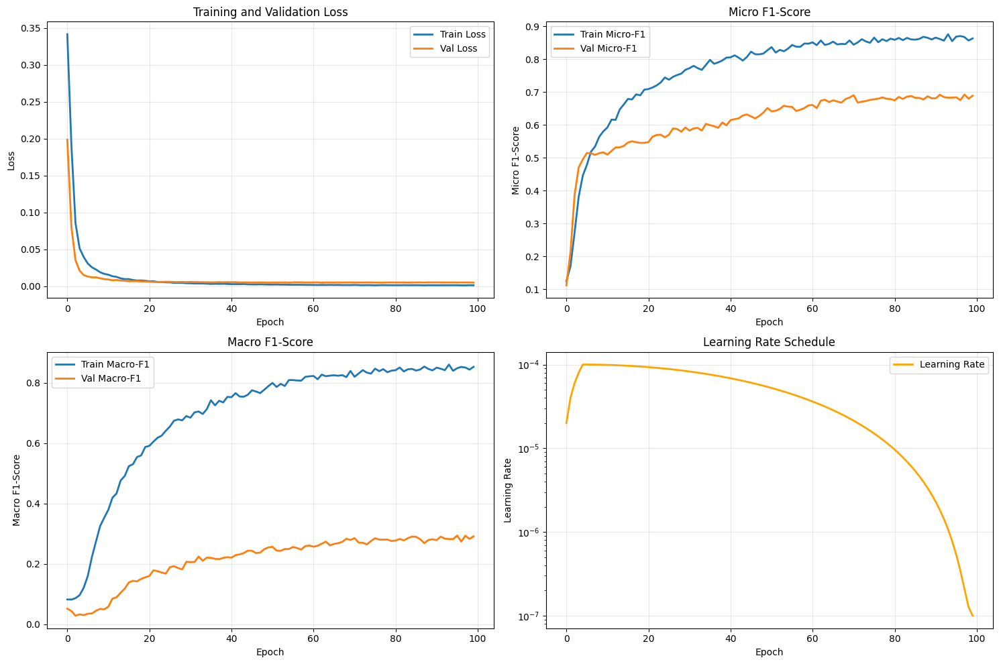

✅ Training history saved to c:\Users\Natsu\OneDrive\เดสก์ท็อป\Work\seminar1_Project\outputs\results


In [23]:
# Plot training history
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Loss
axes[0, 0].plot(history['train_loss'], label='Train Loss', linewidth=2)
axes[0, 0].plot(history['val_loss'], label='Val Loss', linewidth=2)
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].set_title('Training and Validation Loss')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# Micro F1
axes[0, 1].plot(history['train_micro_f1'], label='Train Micro-F1', linewidth=2)
axes[0, 1].plot(history['val_micro_f1'], label='Val Micro-F1', linewidth=2)
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Micro F1-Score')
axes[0, 1].set_title('Micro F1-Score')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# Macro F1
axes[1, 0].plot(history['train_macro_f1'], label='Train Macro-F1', linewidth=2)
axes[1, 0].plot(history['val_macro_f1'], label='Val Macro-F1', linewidth=2)
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Macro F1-Score')
axes[1, 0].set_title('Macro F1-Score')
axes[1, 0].legend()
axes[1, 0].grid(alpha=0.3)

# Learning Rate
axes[1, 1].plot(history['lr'], label='Learning Rate', color='orange', linewidth=2)
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Learning Rate')
axes[1, 1].set_title('Learning Rate Schedule')
axes[1, 1].set_yscale('log')
axes[1, 1].legend()
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(config.RESULT_DIR / 'training_history.png', dpi=300, bbox_inches='tight')
plt.show()

# Save history
import json
with open(config.RESULT_DIR / 'training_history.json', 'w') as f:
    json.dump(history, f, indent=4)

print(f"✅ Training history saved to {config.RESULT_DIR}")

## 12. Model Evaluation และ Testing
### ประเมินผลโมเดลอย่างละเอียด

In [24]:
# Load best model
checkpoint = torch.load(config.MODEL_DIR / 'best_model.pt')
model.load_state_dict(checkpoint['model_state_dict'])
print(f"✅ Loaded best model from epoch {checkpoint['epoch']+1}")
print(f"Best Validation Macro-F1: {checkpoint['best_val_f1']:.4f}")

# Evaluation function
def evaluate_model(model, dataloader, device, threshold=0.5):
    """Comprehensive model evaluation"""
    model.eval()
    
    all_predictions = []
    all_probabilities = []
    all_targets = []
    all_img_ids = []
    
    with torch.no_grad():
        for images, labels, img_ids in tqdm(dataloader, desc="Evaluating"):
            images = images.to(device)
            
            # Forward pass
            if config.USE_AMP:
                with torch.cuda.amp.autocast():
                    outputs = model(images)
            else:
                outputs = model(images)
            
            # Get probabilities
            probs = torch.sigmoid(outputs)
            
            all_probabilities.append(probs.cpu())
            all_targets.append(labels.cpu())
            all_img_ids.extend(img_ids)
    
    # Concatenate all batches
    all_probs = torch.cat(all_probabilities, dim=0).numpy()
    all_targets = torch.cat(all_targets, dim=0).numpy()
    all_preds = (all_probs > threshold).astype(int)
    
    return all_preds, all_probs, all_targets, all_img_ids

# Evaluate on test set
print("\n" + "="*50)
print("EVALUATING ON TEST SET")
print("="*50)

predictions, probabilities, targets, img_ids = evaluate_model(
    model, test_loader, device, threshold=config.CLASSIFICATION_THRESHOLD
)

print(f"\nPredictions shape: {predictions.shape}")
print(f"Targets shape: {targets.shape}")

✅ Loaded best model from epoch 96
Best Validation Macro-F1: 0.2935

EVALUATING ON TEST SET


Evaluating:   0%|          | 0/18 [00:00<?, ?it/s]


Predictions shape: (288, 44)
Targets shape: (288, 44)


## 13. ROC Curves และ AUC Analysis
### วิเคราะห์ ROC curves สำหรับทุกโรค

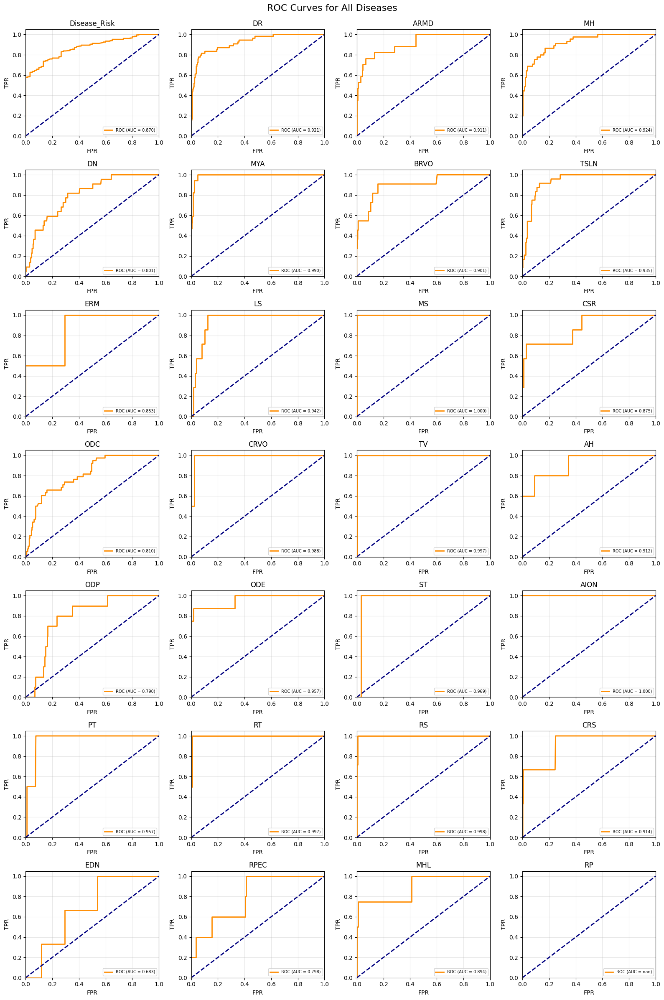


✅ Mean AUC: nan
✅ Median AUC: nan


In [25]:
# ROC Curves and AUC for each disease
from sklearn.metrics import roc_curve, auc

fig, axes = plt.subplots(7, 4, figsize=(16, 24))
axes = axes.flatten()

for idx, disease in enumerate(disease_columns):
    if idx >= len(axes):
        break
    
    # Calculate ROC curve
    fpr, tpr, _ = roc_curve(targets[:, idx], probabilities[:, idx])
    roc_auc = auc(fpr, tpr)
    
    # Plot
    axes[idx].plot(fpr, tpr, color='darkorange', lw=2,
                   label=f'ROC (AUC = {roc_auc:.3f})')
    axes[idx].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axes[idx].set_xlim([0.0, 1.0])
    axes[idx].set_ylim([0.0, 1.05])
    axes[idx].set_xlabel('FPR')
    axes[idx].set_ylabel('TPR')
    axes[idx].set_title(f'{disease}')
    axes[idx].legend(loc="lower right", fontsize=7)
    axes[idx].grid(alpha=0.3)

plt.suptitle('ROC Curves for All Diseases', fontsize=16, y=0.995)
plt.tight_layout()
plt.savefig(config.RESULT_DIR / 'roc_curves.png', dpi=300, bbox_inches='tight')
plt.show()

# Calculate average AUC
aucs = []
for idx in range(len(disease_columns)):
    fpr, tpr, _ = roc_curve(targets[:, idx], probabilities[:, idx])
    aucs.append(auc(fpr, tpr))

print(f"\n✅ Mean AUC: {np.mean(aucs):.4f}")
print(f"✅ Median AUC: {np.median(aucs):.4f}")

## 14. Prediction Visualization
### แสดงตัวอย่างการ predict จากโมเดล

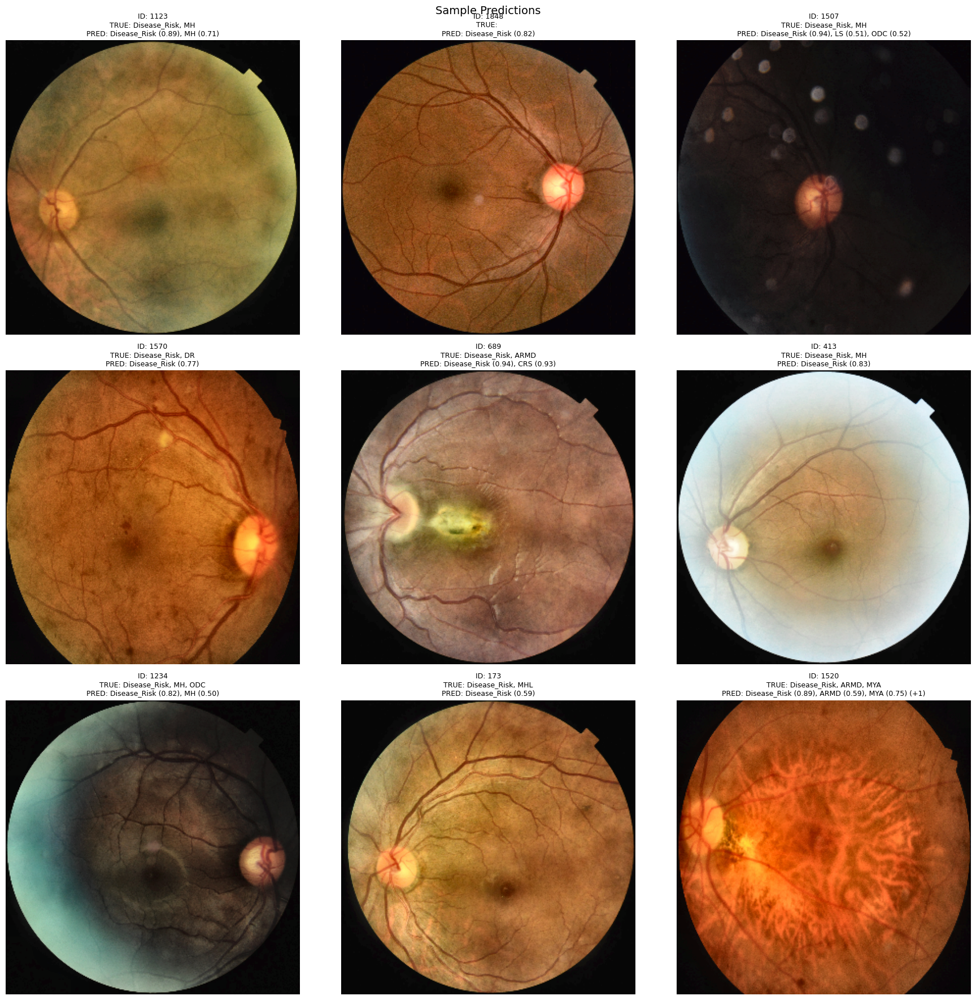

✅ Prediction visualization complete!


In [26]:
# Visualize predictions on sample images
def visualize_predictions(model, dataset, indices, device, threshold=0.5):
    """Visualize model predictions on sample images"""
    model.eval()
    
    fig, axes = plt.subplots(3, 3, figsize=(18, 18))
    axes = axes.flatten()
    
    with torch.no_grad():
        for plot_idx, data_idx in enumerate(indices):
            if plot_idx >= 9:
                break
            
            # Get data
            image, labels, img_id = dataset[data_idx]
            
            # Predict
            image_tensor = image.unsqueeze(0).to(device)
            outputs = model(image_tensor)
            probs = torch.sigmoid(outputs).cpu().numpy()[0]
            
            # Get predictions
            pred_indices = np.where(probs > threshold)[0]
            true_indices = np.where(labels.numpy() > 0.5)[0]
            
            # Denormalize image for display
            img_display = image.permute(1, 2, 0).numpy()
            img_display = img_display * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
            img_display = np.clip(img_display, 0, 1)
            
            # Plot
            axes[plot_idx].imshow(img_display)
            axes[plot_idx].axis('off')
            
            # Title with predictions
            title = f"ID: {img_id}\n"
            title += "TRUE: " + ", ".join([disease_columns[i] for i in true_indices[:3]])
            if len(true_indices) > 3:
                title += f" (+{len(true_indices)-3})"
            title += "\nPRED: " + ", ".join([f"{disease_columns[i]} ({probs[i]:.2f})" for i in pred_indices[:3]])
            if len(pred_indices) > 3:
                title += f" (+{len(pred_indices)-3})"
            
            axes[plot_idx].set_title(title, fontsize=9)
    
    plt.suptitle('Sample Predictions', fontsize=14)
    plt.tight_layout()
    return fig

# Select random samples
np.random.seed(42)
sample_indices = np.random.choice(len(test_dataset), size=9, replace=False)

fig = visualize_predictions(model, test_dataset, sample_indices, device, threshold=config.CLASSIFICATION_THRESHOLD)
plt.savefig(config.RESULT_DIR / 'sample_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Prediction visualization complete!")

## 15. Inference Function สำหรับภาพใหม่
### ฟังก์ชันสำหรับ predict ภาพจอประสาทตาใหม่

In [27]:
def predict_retina_disease(image_path, model, preprocessor, transform, device, threshold=0.5):
    """
    Predict retina diseases from a single image
    
    Args:
        image_path: Path to retina image
        model: Trained model
        preprocessor: Image preprocessor
        transform: Augmentation/normalization transforms
        device: Device to run on
        threshold: Classification threshold
    
    Returns:
        dict: Predictions with probabilities
    """
    model.eval()
    
    # Load and preprocess image
    image = preprocessor.preprocess(image_path)
    
    # Apply transforms
    transformed = transform(image=image)
    image_tensor = transformed['image'].unsqueeze(0).to(device)
    
    # Predict
    with torch.no_grad():
        if config.USE_AMP:
            with torch.cuda.amp.autocast():
                outputs = model(image_tensor)
        else:
            outputs = model(image_tensor)
        
        probs = torch.sigmoid(outputs).cpu().numpy()[0]
    
    # Get predictions above threshold
    predictions = []
    for idx, prob in enumerate(probs):
        if prob > threshold:
            predictions.append({
                'disease': disease_columns[idx],
                'probability': float(prob),
                'severity': 'High' if prob > 0.8 else 'Medium' if prob > 0.6 else 'Low'
            })
    
    # Sort by probability
    predictions = sorted(predictions, key=lambda x: x['probability'], reverse=True)
    
    return {
        'predictions': predictions,
        'all_probabilities': {disease_columns[i]: float(probs[i]) for i in range(len(disease_columns))},
        'image_path': str(image_path)
    }

# Test inference function
sample_img_path = config.TRAIN_DIR / f"{train_df.iloc[100]['ID']}.png"
result = predict_retina_disease(
    sample_img_path,
    model,
    preprocessor,
    get_val_transforms(config.IMG_SIZE),
    device,
    threshold=config.CLASSIFICATION_THRESHOLD
)

print("="*50)
print("INFERENCE RESULT")
print("="*50)
print(f"Image: {result['image_path']}")
print(f"\nDetected Diseases ({len(result['predictions'])}):")
for pred in result['predictions']:
    print(f"  • {pred['disease']:15s} - {pred['probability']:.2%} ({pred['severity']} confidence)")

print("\nTop 5 Probabilities:")
sorted_probs = sorted(result['all_probabilities'].items(), key=lambda x: x[1], reverse=True)[:5]
for disease, prob in sorted_probs:
    print(f"  {disease:15s}: {prob:.2%}")

INFERENCE RESULT
Image: c:\Users\Natsu\OneDrive\เดสก์ท็อป\Work\seminar1_Project\retinal-disease-classification\Training_Set\Training_Set\Training\101.png

Detected Diseases (1):
  • Disease_Risk    - 94.04% (High confidence)

Top 5 Probabilities:
  Disease_Risk   : 94.04%
  MH             : 42.26%
  BRVO           : 35.50%
  DR             : 34.62%
  LS             : 32.59%


## 16. สรุปผลและบันทึกโมเดล
### สรุปผลการทำงานและข้อมูลสำคัญ

In [28]:
# Create comprehensive summary report
summary_report = {
    "Model Information": {
        "Architecture": "EfficientNet-B3",
        "Input Size": f"{config.IMG_SIZE}x{config.IMG_SIZE}",
        "Number of Classes": len(disease_columns),
        "Total Parameters": f"{sum(p.numel() for p in model.parameters()):,}",
        "Trainable Parameters": f"{sum(p.numel() for p in model.parameters() if p.requires_grad):,}",
    },
    "Training Configuration": {
        "Optimizer": config.OPTIMIZER,
        "Learning Rate": config.LEARNING_RATE,
        "Batch Size": config.BATCH_SIZE,
        "Epochs": config.NUM_EPOCHS,
        "Loss Function": config.LOSS_FUNCTION,
        "Data Balancing": config.BALANCE_METHOD,
        "Cost-Sensitive Learning": config.USE_COST_SENSITIVE,
    },
    "Performance Metrics": {
        "Best Validation Macro-F1": f"{best_val_f1:.4f}",
        "Test Micro-F1": f"{f1_score(targets, predictions, average='micro', zero_division=0):.4f}",
        "Test Macro-F1": f"{f1_score(targets, predictions, average='macro', zero_division=0):.4f}",
        "Mean AUC": f"{np.mean(aucs):.4f}",
        "Median AUC": f"{np.median(aucs):.4f}",
    },
    "Data Information": {
        "Training Samples": len(train_val_df),
        "Test Samples": len(test_df),
        "Disease Classes": disease_columns,
        "Class Imbalance Ratio": f"{imbalance_ratio:.2f}:1",
    },
    "Medical Features": {
        "Preprocessing": "CLAHE, Border Cropping, Normalization",
        "Augmentation": "Rotation, Flip, Brightness/Contrast, Optical Distortion, CLAHE, Noise",
        "Cost-Sensitive Weights": "Applied based on disease severity",
        "Attention Mechanism": "Enabled" if config.USE_ATTENTION else "Disabled",
    }
}

# Print summary
print("\n" + "="*70)
print(" " * 20 + "FINAL SUMMARY REPORT")
print("="*70)

for section, content in summary_report.items():
    print(f"\n📊 {section}:")
    print("-" * 70)
    for key, value in content.items():
        if isinstance(value, list):
            print(f"  {key}:")
            for item in value[:5]:
                print(f"    - {item}")
            if len(value) > 5:
                print(f"    ... and {len(value)-5} more")
        else:
            print(f"  {key:30s}: {value}")

print("\n" + "="*70)
print(" " * 15 + "🎉 PROJECT COMPLETED SUCCESSFULLY! 🎉")
print("="*70)

# Save summary to JSON
import json
with open(config.RESULT_DIR / 'summary_report.json', 'w') as f:
    json.dump(summary_report, f, indent=4)

print(f"\n✅ Summary report saved to: {config.RESULT_DIR / 'summary_report.json'}")
print(f"✅ Best model saved to: {config.MODEL_DIR / 'best_model.pt'}")
print(f"✅ Results saved to: {config.RESULT_DIR}")

# List all saved files
print("\n📁 Generated Files:")
result_files = list(config.RESULT_DIR.glob('*'))
model_files = list(config.MODEL_DIR.glob('*'))

print(f"\n  Results ({len(result_files)} files):")
for f in sorted(result_files)[:10]:
    print(f"    - {f.name}")
if len(result_files) > 10:
    print(f"    ... and {len(result_files)-10} more files")

print(f"\n  Models ({len(model_files)} files):")
for f in sorted(model_files):
    size_mb = f.stat().st_size / (1024 * 1024)
    print(f"    - {f.name} ({size_mb:.1f} MB)")


                    FINAL SUMMARY REPORT

📊 Model Information:
----------------------------------------------------------------------
  Architecture                  : EfficientNet-B3
  Input Size                    : 300x300
  Number of Classes             : 44
  Total Parameters              : 13,115,476
  Trainable Parameters          : 13,115,476

📊 Training Configuration:
----------------------------------------------------------------------
  Optimizer                     : adamw
  Learning Rate                 : 0.0001
  Batch Size                    : 16
  Epochs                        : 100
  Loss Function                 : focal_loss
  Data Balancing                : weighted_sampler
  Cost-Sensitive Learning       : True

📊 Performance Metrics:
----------------------------------------------------------------------
  Best Validation Macro-F1      : 0.2935
  Test Micro-F1                 : 0.6840
  Test Macro-F1                 : 0.2935
  Mean AUC                      : nan
 

---
## 📚 คำแนะนำการใช้งาน

### การเทรนโมเดล:
1. **ปรับพารามิเตอร์**: แก้ไข `Config` class ตามต้องการ
2. **รันทุก cell**: Execute cells ตามลำดับ
3. **Monitor**: ดู training progress และ metrics
4. **Checkpoint**: โมเดลที่ดีที่สุดจะถูกบันทึกอัตโนมัติ

### คุณสมบัติสำคัญ:
- ✅ **Medical-Specific Preprocessing**: CLAHE, border cropping
- ✅ **Advanced Augmentation**: Rotation, distortion, color adjustment
- ✅ **Cost-Sensitive Learning**: ให้น้ำหนักโรคร้ายแรงมากกว่า
- ✅ **Data Balancing**: Weighted sampling สำหรับข้อมูลไม่สมดุล
- ✅ **Focal Loss**: จัดการ class imbalance
- ✅ **Attention Mechanism**: เพิ่มความแม่นยำ
- ✅ **Mixed Precision**: เทรนเร็วขึ้น ใช้ memory น้อยลง
- ✅ **Early Stopping**: หยุดเทรนเมื่อไม่มีการพัฒนา
- ✅ **Comprehensive Evaluation**: Metrics, ROC curves, visualizations

### การปรับแต่งเพิ่มเติม:
```python
# ปรับ learning rate
config.LEARNING_RATE = 5e-5

# เปลี่ยน batch size
config.BATCH_SIZE = 32

# เปลี่ยน loss function
config.LOSS_FUNCTION = "asymmetric_loss"

# ปรับ threshold
config.CLASSIFICATION_THRESHOLD = 0.4

# เพิ่ม epochs
config.NUM_EPOCHS = 150
```

### การใช้โมเดล inference:
```python
# Predict ภาพใหม่
result = predict_retina_disease(
    image_path="path/to/image.png",
    model=model,
    preprocessor=preprocessor,
    transform=get_val_transforms(config.IMG_SIZE),
    device=device,
    threshold=0.5
)

print(result['predictions'])
```

---
**หมายเหตุ**: โปรแกรมนี้ออกแบบโดยคำนึงถึงหลักการทางการแพทย์และความแม่นยำในการวินิจฉัยโรคจอประสาทตา